In [2]:
import tsai.all
import datetime
import pandas as pd
import torch
import numpy as np
import wandb
from fastai.callback.wandb import WandbCallback
from fastai.callback.tracker import EarlyStoppingCallback, SaveModelCallback
import time
import math

The paper authors recommend to standardize data by feature. This can be done by adding TSStandardize(by_var=True as a batch_tfm when creating the TSDataLoaders.

In [3]:
%run ../../shared_functions.py
%run ../../my_shared_functions.py

<Figure size 640x480 with 0 Axes>

In [4]:
DIR_INPUT = '../../../fraud-detection-handbook/simulated-data-transformed/data/'

BEGIN_DATE = "2018-06-11"
END_DATE = "2018-09-14"

print("Load  files")
%time transactions_df=read_from_files(DIR_INPUT, BEGIN_DATE, END_DATE)
print("{0} transactions loaded, containing {1} fraudulent transactions".format(len(transactions_df),transactions_df.TX_FRAUD.sum()))

output_feature="TX_FRAUD"

input_features=['TX_AMOUNT','TX_DURING_WEEKEND', 'TX_DURING_NIGHT', 'CUSTOMER_ID_NB_TX_1DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_1DAY_WINDOW', 'CUSTOMER_ID_NB_TX_7DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_7DAY_WINDOW', 'CUSTOMER_ID_NB_TX_30DAY_WINDOW',
       'CUSTOMER_ID_AVG_AMOUNT_30DAY_WINDOW', 'TERMINAL_ID_NB_TX_1DAY_WINDOW',
       'TERMINAL_ID_RISK_1DAY_WINDOW', 'TERMINAL_ID_NB_TX_7DAY_WINDOW',
       'TERMINAL_ID_RISK_7DAY_WINDOW', 'TERMINAL_ID_NB_TX_30DAY_WINDOW',
       'TERMINAL_ID_RISK_30DAY_WINDOW']

Load  files
CPU times: total: 531 ms
Wall time: 525 ms
919767 transactions loaded, containing 8195 fraudulent transactions


#### Default

In [4]:
BEGIN_DATE = "2018-08-08"
start_date_training = datetime.datetime.strptime(BEGIN_DATE, "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7


delta_valid = delta_test

(train_df, valid_df)=get_train_test_set(transactions_df,start_date_training,
                                       delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_test)

SEQ_LEN = 5

In [5]:
SEED = 42

if torch.cuda.is_available():
    DEVICE = "cuda" 
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

seed_everything(SEED)

Selected device is cuda


In [6]:
(train_df, valid_df)=scaleData(train_df, valid_df,input_features)
x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
X, y, splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])

##### Fit 1 cycle 

In [7]:
config = dict(
    dataset_id = 'fraud-detection-handbook-transformed',
    validation = 'train test split',
    seed = SEED,
    begin_date = BEGIN_DATE,
    delta_train = delta_train,
    delta_delay = delta_delay,
    delta_test = delta_test,
    batch_size=64,
    num_workers=0,
    seq_len=SEQ_LEN,
    max_seq_len=None,
    n_layers=3,
    d_model=128,
    n_heads=16,
    d_k=None,
    d_v=None,
    d_ff=256,
    dropout=0.1,
    act='gelu',
    fc_dropout=0.,
    optimizer='adam',
    early_stopping=True,
    early_stopping_patience=2,
    max_epochs=100,
    scale=True,
    criterion='bce',
    one_cycle_policy=True
)
wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['tst', 'transformer', 'tsai', 'imbalance-not-considered'])
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chamera (mgr-anomaly-tsxai). Use `wandb login --relogin` to force relogin


In [9]:
dsets = tsai.all.TSDatasets(X, y, splits=splits, inplace=True)
dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, drop_last=False, device=DEVICE)
model = tsai.all.TST(
    c_in=dls.vars, 
    c_out=dls.c,
    seq_len=SEQ_LEN,
    n_layers=config.n_layers,
    d_model=config.d_model,
    n_heads=config.n_heads,
    d_k=config.d_k,
    d_v=config.d_v,
    d_ff=config.d_ff,
    dropout=config.dropout,
    act=config.act,
    fc_dropout=config.fc_dropout
    )

In [10]:
criterion = tsai.all.BCEWithLogitsLossFlat()
learn = tsai.all.ts_learner(
    dls,
    model,
    loss_func=criterion,
    opt_func=tsai.all.Adam,
    device=DEVICE,
    metrics=[],
    model_dir='TST',
    cbs=[
        WandbCallback(
            log='all',
            log_model=True,
            seed=config.seed),
        EarlyStoppingCallback(
            patience=config.early_stopping_patience
        ),
        SaveModelCallback(
            fname='tst_fit_one_cycle'
        )])

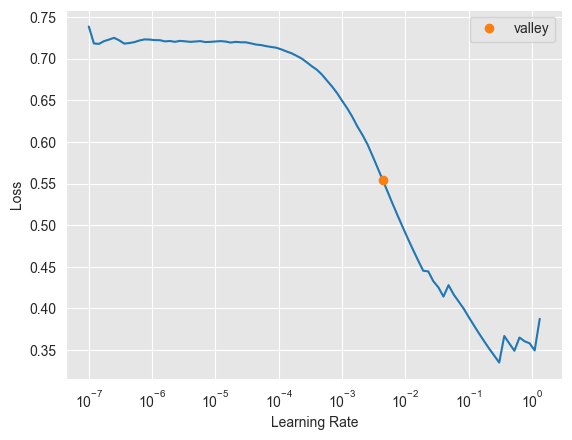

In [11]:
lr = learn.lr_find().valley
wandb.config.update({"lr": lr})

In [12]:
start_time=time.time()
learn.fit_one_cycle(config.max_epochs, lr)
training_execution_time=time.time()-start_time

WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.021501,0.022643,00:34
1,0.018634,0.020562,00:37
2,0.022524,0.020292,00:36
3,0.028801,0.020503,00:37
4,0.019702,0.020382,00:36


Better model found at epoch 0 with valid_loss value: 0.022642508149147034.
Better model found at epoch 1 with valid_loss value: 0.020561834797263145.
Better model found at epoch 2 with valid_loss value: 0.02029161900281906.
No improvement since epoch 2: early stopping


In [13]:
start_time=time.time()
valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
prediction_execution_time=time.time()-start_time
predictions_df = valid_df
predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
    
performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
performance_df

,AUC ROC,Average precision,F1 score,Card Precision@100
0,0.898,0.647,0.661,0.301


In [14]:
wandb.log({'Training execution time': training_execution_time})
wandb.log({'Prediction execution time': prediction_execution_time})
wandb.log({'AUC ROC': performance_df.loc[0,'AUC ROC']})
wandb.log({'Average precision': performance_df.loc[0,'Average precision']})
wandb.log({'F1 score': performance_df.loc[0,'F1 score']})
wandb.log({'Card Precision@100': performance_df.loc[0,'Card Precision@100']})
wandb.finish()

AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇██
mom_0,███████████▇▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▂▂▂▁▁
raw_loss,█▂▁▁▁▅▃▁▁▁▁▁▁▁▁▁▁▁▁▄▂▂▁▁▁▅▁▁▄▂█▁▁▆▁▁▁▁▁▆


#### Sweeps

In [5]:
start_date_training = datetime.datetime.strptime("2018-07-25", "%Y-%m-%d")
delta_train=7
delta_delay=7
delta_test=7
delta_valid = delta_test

n_folds=4

start_date_training_for_valid = start_date_training+datetime.timedelta(days=-(delta_delay+delta_valid))
start_date_training_for_test = start_date_training+datetime.timedelta(days=(n_folds-1)*delta_test)
delta_assessment = delta_valid

In [6]:
SEED = 42
seed_everything(SEED)

prequential_split = []
        
for fold in range(n_folds):
    start_date_training_fold = start_date_training-datetime.timedelta(days=fold*delta_assessment)
    
    (train_df, test_df)=get_train_test_set(transactions_df,
                                            start_date_training=start_date_training_fold,
                                            delta_train=delta_train,delta_delay=delta_delay,delta_test=delta_assessment)
    
    prequential_split.append((train_df, test_df))

In [7]:
SEQ_LEN = 5
if torch.cuda.is_available():
    DEVICE = "cuda" 
else:
    DEVICE = "cpu"
print("Selected device is",DEVICE)

Selected device is cuda


#### Fit 1 cycle with TSStandardize and non-default dropouts

(based on https://colab.research.google.com/github/timeseriesAI/tsai/blob/master/tutorial_nbs/07_Time_Series_Classification_with_Transformers.ipynb)

In [8]:
sweep_config = {
                'method': 'random', 
                'metric': {
                    'goal': 'minimize',
                    'name': 'val_loss'
                    },
                'parameters': {
                    'one_cycle_policy' : {
                        'value' : True
                    },
                    'batch_size': {
                        'values' : [64, 128, 256]
                    },
                    'max_epochs': {
                        'values': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
                    },
                    'num_workers': {
                        'value' : 0
                    },
                    'seed': {
                        'value' : 42
                    },
                    'n_layers': { # depth
                        'values' : [1, 2, 3, 4, 5]
                    },
                    'd_model': { # dim
                        'values' : [16, 32, 64, 128]
                    },
                    'n_heads': { # h
                        'values' : [1, 2, 4, 16]
                    },
                    'd_k': { # dk (d_model / n_heads)
                        'values' : [None]
                    },
                    'd_v': { # d_model / n_heads 
                        'values' : [None]
                    },
                    'd_ff': { # dimMLP
                        'values' : [256, 128, 64, 32]
                    },
                    'dropout': { #pdrop
                        'values' : [0.1, 0.3, 0.5]
                    },
                    'act': {
                        'values' : ['gelu']
                    },
                    'fc_dropout': {
                        'values' : [0., 0.2, 0.4, 0.6, 0.8]
                    },
                    'TSStandardize_by_var' : {
                        'value' : True
                    }
                }
 }

In [9]:
sweep_id = wandb.sweep(sweep_config, project="mgr-anomaly-tsxai-project")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Create sweep with ID: i3zaqx52
Sweep URL: https://wandb.ai/mgr-anomaly-tsxai/mgr-anomaly-tsxai-project/sweeps/i3zaqx52


In [10]:
def train(config=None):
    with wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['tst', 'transformer', 'tsai', 'imbalance-not-considered', 'sweeps', 'tsai-transformer-standardize']):
        config = wandb.config
        training_execution_times = []
        prediction_execution_times = []
        aucs = []
        average_precisions = []
        f1_scores = []
        card_precisions = []
        for i in range(n_folds):
            train_df = prequential_split[i][0]
            valid_df = prequential_split[i][1]
            # (train_df, valid_df)=scaleData(train_df, valid_df,input_features)
            x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
            x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
            X, y, tsai_splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])
            dsets = tsai.all.TSDatasets(X, y, splits=tsai_splits, inplace=True)
            dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, device=DEVICE, drop_last=False, batch_tfms=tsai.all.TSStandardize(by_var=True))
            
            model = tsai.all.TST(
                c_in=dls.vars, 
                c_out=dls.c,
                seq_len=SEQ_LEN,
                n_layers=config.n_layers,
                d_model=config.d_model,
                n_heads=config.n_heads,
                d_k=config.d_k,
                d_v=config.d_v,
                d_ff=config.d_ff,
                dropout=config.dropout,
                act=config.act,
                fc_dropout=config.fc_dropout
            )
            
            criterion = tsai.all.BCEWithLogitsLossFlat()
            learn = tsai.all.ts_learner(
                dls,
                model,
                loss_func=criterion,
                opt_func=tsai.all.Adam,
                device=DEVICE,
                metrics=[],
                model_dir='TST',
                cbs=[
                    WandbCallback(
                        log=None,
                        log_model=False,
                        seed=config.seed)])

            valley = learn.lr_find().valley

            start_time=time.time()
            learn.fit_one_cycle(config.max_epochs, valley)
            training_execution_times.append(time.time()-start_time)

            start_time=time.time()
            valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
            prediction_execution_time=time.time()-start_time
            predictions_df = valid_df
            predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
                
            performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
            aucs.append(performance_df.loc[0,'AUC ROC'])
            average_precisions.append(performance_df.loc[0,'Average precision'])
            f1_scores.append(performance_df.loc[0,'F1 score'])
            card_precisions.append(performance_df.loc[0,'Card Precision@100'])

        wandb.log({'Training execution time': np.sum(training_execution_times) / n_folds})
        wandb.log({'Prediction execution time': np.sum(prediction_execution_times) / n_folds})
        wandb.log({'AUC ROC': np.sum(aucs) / n_folds})
        wandb.log({'Average precision': np.sum(average_precisions) / n_folds})
        wandb.log({'F1 score': np.sum(f1_scores) / n_folds})
        wandb.log({'Card Precision@100': np.sum(card_precisions) / n_folds})

wandb: Agent Starting Run: hockrif5 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 14
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chamera (mgr-anomaly-tsxai). Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032861,0.023170,00:18
1,0.032888,0.025972,00:18
2,0.044815,0.030114,00:18
3,0.043508,0.030495,00:21
4,0.040467,0.026152,00:20
5,0.028310,0.022692,00:19
6,0.030716,0.022465,00:19
7,0.025738,0.023153,00:19
8,0.028126,0.020762,00:19
9,0.018734,0.020952,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038740,0.028460,00:19
1,0.030721,0.024832,00:19
2,0.030498,0.033329,00:19
3,0.037095,0.025830,00:19
4,0.033597,0.023192,00:19
5,0.032333,0.023494,00:19
6,0.023892,0.023691,00:19
7,0.029373,0.021898,00:19
8,0.026151,0.021881,00:19
9,0.024304,0.020748,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032057,0.024634,00:19
1,0.046842,0.027049,00:19
2,0.034680,0.032385,00:19
3,0.040391,0.024502,00:19
4,0.043150,0.024413,00:19
5,0.036463,0.023241,00:19
6,0.037850,0.026784,00:19
7,0.025489,0.023266,00:19
8,0.029275,0.022445,00:19
9,0.029379,0.021163,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045192,0.031379,00:19
1,0.028887,0.020644,00:19
2,0.031997,0.019759,00:19
3,0.023186,0.018586,00:19
4,0.026811,0.023052,00:19
5,0.024903,0.018074,00:19
6,0.025874,0.018351,00:19
7,0.024602,0.017474,00:19
8,0.025699,0.016984,00:20
9,0.015913,0.017378,00:19


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▇▇▆▅▄▃▂▁▁▂▄▄▃▃▂▂▁▁▁▅██▇▆▄▃▂▁▁▂▂▂▂▂▂▁▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▇██
raw_loss,▂▃▁▁▂▅▁▄▁▁█▁▁▁▂▁▁▁▁▁▄▁▄▂▁▁▁▅▅▂▂▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: wjijfhll with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 12
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042547,0.032735,00:18
1,0.047125,0.038094,00:17
2,0.044305,0.035810,00:17
3,0.048548,0.033319,00:17
4,0.046502,0.035787,00:17
5,0.036107,0.034523,00:17
6,0.040943,0.032173,00:17
7,0.043249,0.033707,00:17
8,0.045399,0.031727,00:17
9,0.038467,0.031906,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043191,0.032956,00:17
1,0.038441,0.042635,00:17
2,0.038983,0.042933,00:17
3,0.039183,0.036338,00:17
4,0.041717,0.040416,00:17
5,0.055706,0.034607,00:17
6,0.036419,0.034520,00:17
7,0.040241,0.035051,00:17
8,0.035787,0.034060,00:17
9,0.036495,0.034095,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058394,0.028768,00:17
1,0.043851,0.029192,00:17
2,0.044293,0.026652,00:17
3,0.040640,0.037712,00:17
4,0.039505,0.034600,00:17
5,0.039822,0.029866,00:17
6,0.042416,0.027752,00:17
7,0.040656,0.029804,00:17
8,0.039496,0.028895,00:17
9,0.040692,0.027537,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.068133,0.032100,00:17
1,0.042275,0.025450,00:17
2,0.037212,0.021729,00:17
3,0.036346,0.020915,00:17
4,0.038109,0.021315,00:17
5,0.036829,0.020293,00:17
6,0.030052,0.020519,00:17
7,0.029651,0.020897,00:17
8,0.030414,0.019432,00:17
9,0.031985,0.019573,00:17


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▅██▇▆▅▃▂▁▁▂▃▃▃▂▂▁▁▁▁▂▂▂▂▂▁▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▆▇█▇▂▁▁▂▄▅▇▇█
raw_loss,▁▄▁▁▁▄▁▂▆▁▆▂▁▇▁▂▁▁▁▂█▂▂▅▂▂▂▂▁▁▅▂▁▁▁▂▁▁▂▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 0q6n3ome with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 20
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050182,0.036195,00:43
1,0.065173,0.058195,00:41
2,0.068947,0.043170,00:41
3,0.049888,0.036544,00:41
4,0.049505,0.035741,00:41
5,0.052162,0.035575,00:41
6,0.054521,0.035539,00:41
7,0.047710,0.034994,00:41
8,0.048330,0.035798,00:41
9,0.049654,0.042565,00:41


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035822,0.026262,00:42
1,0.033442,0.032831,00:41
2,0.054121,0.058332,00:42
3,0.041539,0.032880,00:43
4,0.040404,0.032758,00:42
5,0.039070,0.035952,00:42
6,0.043534,0.034505,00:42
7,0.040805,0.036976,00:41
8,0.051857,0.038598,00:41
9,0.040918,0.038953,00:41


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042730,0.025842,00:43
1,0.035379,0.025985,00:46
2,0.051939,0.039712,00:46
3,0.053674,0.035555,00:44
4,0.033147,0.031852,00:44
5,0.046160,0.031748,00:44
6,0.052875,0.032376,00:43
7,0.043513,0.030928,00:43
8,0.044424,0.028756,00:43
9,0.034641,0.028121,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036223,0.019977,00:42
1,0.035567,0.020748,00:42
2,0.045682,0.046812,00:41
3,0.055658,0.040149,00:41
4,0.060625,0.029051,00:41
5,0.030543,0.025107,00:41
6,0.039205,0.025671,00:42
7,0.033902,0.025085,00:42
8,0.043009,0.029828,00:42
9,0.036537,0.026369,00:41


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▅▅▅▄▃▂▂▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▃▆▁▁▁▁▁▁▂▃▁▇▂▁▁▁▄▁▃█▂▁▁▁▂▄▆▁▁▁▅▂▁▁▁▁▂▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: twhhwcjx with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 18
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040533,0.026720,00:13
1,0.024476,0.021073,00:13
2,0.025968,0.019376,00:13
3,0.027992,0.019427,00:13
4,0.028066,0.019919,00:13
5,0.033075,0.022012,00:13
6,0.025664,0.019037,00:13
7,0.025083,0.019222,00:13
8,0.025334,0.019303,00:13
9,0.026845,0.019341,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038429,0.030068,00:13
1,0.038245,0.026303,00:13
2,0.027831,0.023306,00:13
3,0.025055,0.022849,00:13
4,0.024205,0.022956,00:13
5,0.029662,0.023488,00:13
6,0.030565,0.022604,00:13
7,0.024754,0.022590,00:13
8,0.029527,0.023041,00:14
9,0.024535,0.021115,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043939,0.027462,00:13
1,0.032767,0.021287,00:13
2,0.032968,0.022558,00:14
3,0.033833,0.028036,00:13
4,0.033996,0.023322,00:13
5,0.036460,0.024072,00:13
6,0.033323,0.024753,00:13
7,0.035864,0.023291,00:13
8,0.038196,0.025404,00:13
9,0.036520,0.023997,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.104896,0.080130,00:13
1,0.033945,0.025427,00:14
2,0.031373,0.019837,00:13
3,0.025202,0.020794,00:13
4,0.024928,0.018287,00:14
5,0.023656,0.017729,00:14
6,0.037815,0.018474,00:14
7,0.032264,0.018016,00:14
8,0.033033,0.016977,00:14
9,0.023710,0.016723,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▆▆▅▄▃▃▂▁▁▄▆▆▅▅▃▂▂▁▁▄██▇▆▄▃▂▁▁▂▃▃▃▂▂▁▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▃▁▁▂▃▅▆▇█
raw_loss,▂▁▁▂▂▁▁▁▁▂▂▂▂▁▁▂▂▂▁▁█▂▂▁▁▁▂▁▂▂▃▁▁▁▂▁▁▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 9ih5lmhx with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039847,0.026444,00:25
1,0.041387,0.037437,00:25
2,0.044683,0.035955,00:25
3,0.048208,0.035063,00:25
4,0.053381,0.032716,00:25
5,0.043039,0.033694,00:26
6,0.048766,0.032541,00:26
7,0.042530,0.033022,00:26
8,0.043412,0.031604,00:26
9,0.036976,0.030973,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034758,0.027762,00:27
1,0.040915,0.039879,00:27
2,0.034473,0.033247,00:28
3,0.042610,0.032548,00:26
4,0.037032,0.031067,00:27
5,0.037038,0.031331,00:27
6,0.035756,0.031333,00:26
7,0.032217,0.031522,00:25
8,0.050728,0.031281,00:25
9,0.035411,0.031157,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.080406,0.030806,00:26
1,0.039112,0.022836,00:26
2,0.039439,0.020378,00:26
3,0.030284,0.020242,00:26
4,0.028462,0.021343,00:26
5,0.026804,0.019131,00:26
6,0.026136,0.019425,00:26
7,0.023792,0.018345,00:26
8,0.030696,0.018169,00:26
9,0.023831,0.018199,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034981,0.023894,00:26
1,0.045291,0.023925,00:26
2,0.045029,0.026867,00:26
3,0.044513,0.027341,00:26
4,0.045852,0.027667,00:26
5,0.055352,0.026104,00:26
6,0.035532,0.026632,00:26
7,0.033218,0.025337,00:26
8,0.037452,0.024948,00:26
9,0.035109,0.024830,00:26


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▃▅▅▅▄▃▂▂▁▁▂▂▂▂▂▂▁▁▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▂▃▁▁▂▃▂▃▂█▁▁▂▁▂▁▂▁▂█▂▁▁▂▁▁▂▁▁▅▁▃▁▁▂▁▂▁▂


wandb: Agent Starting Run: xllgy4hw with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 4
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036463,0.027021,00:05
1,0.029679,0.022712,00:05
2,0.023844,0.021156,00:05
3,0.023585,0.018963,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.074322,0.034628,00:05
1,0.026234,0.022581,00:05
2,0.022179,0.020838,00:05
3,0.018051,0.020520,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051585,0.026649,00:05
1,0.029370,0.021049,00:05
2,0.024579,0.019483,00:05
3,0.023283,0.018991,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039294,0.023456,00:05
1,0.026431,0.019618,00:05
2,0.022529,0.018421,00:05
3,0.019396,0.017989,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▂▂▂▂▂▂▁▁▁▁▃▄▄▃▃▂▂▁▁▂▃▇▇▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▁▁▁▁▁▁▁▁▁▇▂▂▁▁▁▁▁▁▁█▂▁▁▂▁▂▁▁▁▄▁▁▁▁▁▂▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: sryqiz3g with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 16
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033773,0.024042,00:22
1,0.024983,0.024507,00:22
2,0.024993,0.021276,00:22
3,0.031544,0.020401,00:22
4,0.027030,0.020687,00:22
5,0.026091,0.019408,00:22
6,0.025932,0.020083,00:22
7,0.022375,0.018683,00:22
8,0.027540,0.019013,00:22
9,0.024078,0.018637,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029838,0.025811,00:22
1,0.027395,0.022600,00:22
2,0.034442,0.022483,00:22
3,0.028851,0.023362,00:22
4,0.026708,0.022563,00:22
5,0.021895,0.021395,00:22
6,0.023734,0.021179,00:22
7,0.025875,0.021024,00:22
8,0.025703,0.019415,00:22
9,0.025690,0.019473,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031156,0.021732,00:22
1,0.030508,0.028992,00:22
2,0.027485,0.023998,00:22
3,0.033017,0.027277,00:22
4,0.031349,0.020954,00:22
5,0.024253,0.020264,00:22
6,0.026840,0.021775,00:22
7,0.027145,0.019149,00:22
8,0.024798,0.018434,00:22
9,0.023206,0.017839,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.065337,0.028822,00:22
1,0.025304,0.018510,00:22
2,0.024622,0.021070,00:22
3,0.025652,0.016655,00:22
4,0.021444,0.017543,00:22
5,0.025895,0.017416,00:22
6,0.024543,0.016325,00:22
7,0.025192,0.016658,00:22
8,0.022902,0.016470,00:22
9,0.020275,0.015874,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▅██▇▅▄▃▂▁▁▂▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▂▁▁▂▂▁▁▁▂▁▁▂▁▁▁▁▁▁█▂▁▁▁▃▁▂▂▁▃▁▂▁▁▁▂▂▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qudvm3ua with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 14
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.097910,0.043069,00:11
1,0.024175,0.020432,00:11
2,0.021812,0.020447,00:12
3,0.024233,0.019905,00:12
4,0.026190,0.018952,00:12
5,0.021220,0.018906,00:11
6,0.021710,0.018826,00:12
7,0.017631,0.018844,00:12
8,0.020376,0.017791,00:12
9,0.018557,0.017337,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.114372,0.057704,00:12
1,0.027048,0.023135,00:12
2,0.018823,0.022209,00:12
3,0.019846,0.024451,00:12
4,0.019955,0.020486,00:12
5,0.020559,0.019682,00:12
6,0.020663,0.020410,00:11
7,0.017257,0.019378,00:12
8,0.015411,0.019175,00:12
9,0.016681,0.018313,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.105987,0.043888,00:11
1,0.029201,0.019549,00:11
2,0.025154,0.018869,00:12
3,0.025854,0.021860,00:11
4,0.027854,0.018765,00:11
5,0.024603,0.018808,00:12
6,0.025392,0.017427,00:11
7,0.022958,0.018064,00:11
8,0.021695,0.017100,00:11
9,0.020476,0.016533,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045219,0.021900,00:11
1,0.021576,0.023106,00:11
2,0.027817,0.020136,00:11
3,0.041883,0.029732,00:11
4,0.037179,0.025217,00:11
5,0.036694,0.022486,00:11
6,0.030065,0.022922,00:11
7,0.030517,0.022601,00:11
8,0.027009,0.019873,00:11
9,0.028273,0.022939,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▂▄▄▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▄▃▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆██
raw_loss,▄▁▁▁▂▁▁▁▁▂█▁▁▂▁▁▁▁▁▁▆▂▁▁▁▁▂▁▁▁▂▁▂▁▂▂▁▁▁▁


wandb: Agent Starting Run: l4kzq2u8 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 12
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.118908,0.037663,00:13
1,0.042783,0.027271,00:13
2,0.043416,0.027924,00:13
3,0.038596,0.035884,00:13
4,0.037264,0.030580,00:12
5,0.039461,0.027060,00:13
6,0.037874,0.025746,00:12
7,0.035331,0.025552,00:12
8,0.032056,0.026275,00:12
9,0.033469,0.024506,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.154713,0.054116,00:12
1,0.040644,0.030209,00:12
2,0.036279,0.032317,00:12
3,0.036835,0.029220,00:12
4,0.035723,0.030166,00:12
5,0.038287,0.032297,00:12
6,0.036844,0.029474,00:12
7,0.033963,0.028541,00:12
8,0.034084,0.028186,00:12
9,0.038311,0.026778,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.067088,0.037973,00:12
1,0.045412,0.033301,00:12
2,0.048442,0.036143,00:12
3,0.047060,0.039068,00:12
4,0.039327,0.032907,00:12
5,0.042824,0.030190,00:12
6,0.041067,0.027611,00:12
7,0.042497,0.028038,00:12
8,0.038969,0.027571,00:12
9,0.037073,0.026387,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.145980,0.035366,00:12
1,0.041026,0.025943,00:12
2,0.036627,0.020876,00:12
3,0.041537,0.028479,00:12
4,0.041352,0.030267,00:12
5,0.037698,0.029335,00:12
6,0.037400,0.026363,00:12
7,0.040600,0.028686,00:12
8,0.038260,0.030317,00:12
9,0.035885,0.028039,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▂▃▃▃▃▂▂▁▁▂▆██▇▅▄▃▂▁▁▃▄▄▃▃▂▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▄▂▁▁▁▁▁▁▁▁█▁▁▂▁▁▂▁▁▂▃▂▁▂▁▁▂▁▁▁▄▂▂▁▁▂▁▁▁▁


wandb: Agent Starting Run: 1lrh3kzr with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 8
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028745,0.022781,00:26
1,0.025226,0.022290,00:26
2,0.023548,0.022424,00:26
3,0.028110,0.019464,00:26
4,0.029893,0.020853,00:26
5,0.023232,0.018400,00:26
6,0.020291,0.018088,00:26
7,0.018253,0.018006,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035048,0.026893,00:26
1,0.026260,0.022343,00:26
2,0.028963,0.022414,00:26
3,0.015789,0.019229,00:26
4,0.012833,0.019563,00:26
5,0.014341,0.019352,00:26
6,0.023529,0.018538,00:26
7,0.019320,0.018362,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030202,0.030960,00:26
1,0.048525,0.031787,00:26
2,0.035647,0.029107,00:26
3,0.035944,0.023542,00:26
4,0.029237,0.021336,00:26
5,0.018587,0.021956,00:26
6,0.029180,0.020604,00:26
7,0.026782,0.020071,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.021497,0.030238,00:26
1,0.032797,0.032551,00:26
2,0.041932,0.031123,00:26
3,0.044689,0.028081,00:26
4,0.038481,0.027166,00:26
5,0.032566,0.020740,00:26
6,0.032103,0.021569,00:26
7,0.044444,0.020914,00:26


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▃▃▂▂▁▁▁▂▃▃▃▂▂▂▁▁▁▅██▇▅▄▃▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▂▂▁▁▁▂▂▇█▁▁▂▁▁▁▁▂▁▇▁▁▁▁▅▇▂▁▁▃▁▂▁▄▂▂▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: zxq1tlts with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 2
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031991,0.022390,00:18
1,0.026810,0.019610,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024630,0.024800,00:18
1,0.019367,0.022525,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038582,0.022597,00:18
1,0.025512,0.019585,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024484,0.019531,00:18
1,0.021400,0.017474,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▁▄▅▅▅▄▃▂▁▁▁▃▄▄▃▃▂▂▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▂▁▁▁▁▁▁▂▅▁▁▁▁▂▁▁▁▁█▁▁▂▁▁▁▁▂▁▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 2pp3tt8m with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 6
wandb: 	n_heads: 16
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062729,0.036012,00:08
1,0.041852,0.058605,00:08
2,0.040710,0.034232,00:08
3,0.034466,0.029887,00:08
4,0.030525,0.028904,00:08
5,0.029985,0.028740,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.064887,0.033018,00:08
1,0.034717,0.043850,00:08
2,0.032722,0.030629,00:08
3,0.029830,0.027134,00:08
4,0.028290,0.027144,00:08
5,0.028048,0.025542,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062510,0.040956,00:08
1,0.043502,0.040827,00:09
2,0.040275,0.036829,00:09
3,0.034734,0.028823,00:09
4,0.038674,0.027194,00:08
5,0.033217,0.026233,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061277,0.029271,00:08
1,0.040111,0.056897,00:08
2,0.040715,0.046101,00:08
3,0.038536,0.041450,00:08
4,0.037626,0.036681,00:08
5,0.033793,0.035731,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇█▇▆▅▃▂▁▁▄▇▇▆▅▄▂▂▁▂▆██▇▅▄▃▂▁▂▆██▇▅▄▂▂▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▄▂▁▁▁▁▁▁▁▁█▁▁▁▁▂▁▁▁▃▅▁▁▁▁▁▁▁▁▁▃▂▂▁▁▁▂▁▂▁


wandb: Agent Starting Run: fx8pad74 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035582,0.022351,00:18
1,0.026377,0.020382,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029422,0.023021,00:18
1,0.026060,0.021443,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033878,0.023206,00:18
1,0.026475,0.019578,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024884,0.023129,00:18
1,0.019359,0.018134,00:17


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▄▅▅▅▄▃▂▁▁▁▂▃▃▂▂▂▁▁▁▁▃▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▂▁▁▁▁▁▁▂▂▅▂▁▁▁▁▁▁▂▂█▂▁▁▁▂▁▁▁▃▄▁▁▁▁▁▂▁▁▁


wandb: Agent Starting Run: ze0jtlil with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047142,0.053146,00:19
1,0.056088,0.060491,00:19
2,0.054267,0.042013,00:19
3,0.054403,0.040799,00:19
4,0.054640,0.038280,00:19
5,0.046340,0.033239,00:19
6,0.038433,0.032693,00:19
7,0.048789,0.032536,00:19
8,0.039680,0.032478,00:19
9,0.038282,0.032948,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.057257,0.127279,00:19
1,0.045396,0.038210,00:19
2,0.047887,0.039084,00:19
3,0.043724,0.042549,00:19
4,0.039697,0.035799,00:19
5,0.044346,0.035945,00:19
6,0.044386,0.036318,00:19
7,0.040130,0.034788,00:19
8,0.041922,0.034665,00:19
9,0.047124,0.034688,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042734,0.061520,00:19
1,0.035490,0.030713,00:19
2,0.037734,0.030633,00:19
3,0.033018,0.028598,00:19
4,0.027420,0.028039,00:19
5,0.022167,0.023661,00:20
6,0.030324,0.023193,00:20
7,0.025545,0.019817,00:20
8,0.025184,0.021014,00:20
9,0.023356,0.020620,00:20


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038389,0.094036,00:20
1,0.043633,0.035692,00:20
2,0.042991,0.031267,00:20
3,0.032552,0.028982,00:20
4,0.041791,0.026741,00:20
5,0.034209,0.025656,00:20
6,0.040156,0.027253,00:20
7,0.046535,0.026200,00:20
8,0.029198,0.026212,00:21
9,0.032246,0.026147,00:20


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▂▂▂▁▁▁▁▅██▇▆▅▃▂▁▁▂▂▂▂▂▂▁▁▁▁▂▃▃▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▅▁▅▂▅▁▄▁▁▁▁▇▁▁▁▂▇▁▁▁▂▁▁▂▁▄▁▁▁█▃▅▂▁▁▁▁▁▆▅


wandb: Agent Starting Run: jw7zz8zp with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031279,0.022255,00:43
1,0.039027,0.030241,00:43
2,0.033278,0.030093,00:43
3,0.037240,0.034524,00:43
4,0.044272,0.032542,00:43
5,0.034069,0.023599,00:43
6,0.039185,0.024756,00:43
7,0.031396,0.023112,00:43
8,0.030810,0.022409,00:43
9,0.026880,0.022095,00:44


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030051,0.031554,00:43
1,0.042651,0.043909,00:43
2,0.040852,0.036284,00:44
3,0.045500,0.039873,00:44
4,0.051516,0.035450,00:43
5,0.039963,0.035834,00:43
6,0.039002,0.034712,00:43
7,0.036038,0.034878,00:43
8,0.030977,0.035255,00:43
9,0.037570,0.034863,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029693,0.025600,00:43
1,0.037139,0.023356,00:43
2,0.034043,0.020943,00:43
3,0.025552,0.022853,00:43
4,0.029548,0.020373,00:43
5,0.022673,0.018743,00:43
6,0.025082,0.018004,00:43
7,0.024494,0.018076,00:44
8,0.025339,0.017491,00:44
9,0.027652,0.017405,00:44


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028781,0.019352,00:43
1,0.047359,0.035342,00:43
2,0.043559,0.028578,00:44
3,0.042178,0.025499,00:44
4,0.040464,0.026638,00:44
5,0.035876,0.024249,00:44
6,0.036837,0.024602,00:44
7,0.040938,0.024332,00:44
8,0.055476,0.022695,00:43
9,0.032861,0.022417,00:43


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁▁▂▂▂▂▂▂▁▁▁▁▄▆▆▅▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▁▂▂▄▁▁▁▁▄▂▄▁▁▃▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▄▂▁▁█▁▃▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: e3ms71re with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 14
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052747,0.058413,00:50
1,0.047059,0.105662,00:50
2,0.054027,0.115168,00:51
3,0.049365,0.066515,00:52
4,0.042422,0.041181,00:50
5,0.048774,0.035540,00:50
6,0.048572,0.035853,00:52
7,0.047649,0.036696,00:50
8,0.042443,0.035576,00:51
9,0.054064,0.037299,00:53


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026171,0.031934,00:51
1,0.031375,0.032715,00:51
2,0.038542,0.053528,00:50
3,0.045075,0.037452,00:50
4,0.034382,0.029630,00:52
5,0.038206,0.030982,00:52
6,0.036531,0.035007,00:51
7,0.030790,0.029225,00:51
8,0.025476,0.031930,00:52
9,0.029766,0.031057,00:52


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.056894,0.061874,00:56
1,0.056159,0.189802,00:52
2,0.045726,0.241636,00:51
3,0.065447,0.277854,00:50
4,0.060649,0.171185,00:59
5,0.053647,0.151289,00:53
6,0.050151,0.117506,00:51
7,0.056739,0.104668,00:52
8,0.050765,0.082852,00:55
9,0.047350,0.080183,00:53


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046014,0.036273,00:52
1,0.058903,0.030360,00:52
2,0.052608,0.030627,00:50
3,0.044797,0.028551,00:51
4,0.054554,0.038416,00:52
5,0.049661,0.028008,00:52
6,0.037962,0.029328,00:52
7,0.037295,0.030420,00:53
8,0.038332,0.029580,00:52
9,0.041342,0.025315,00:52


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▂▂▂▂▂▂▁▁▁▁▂▃▃▂▂▂▁▁▁▂▅██▇▅▄▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▇██
raw_loss,▁▁▃▁▁▃▂▄▁▁█▁▁▁▁▁▆▁▃▁▇▁▃▁▁▁▃▁▁▁▁▁▁▂▁▁▂▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: a114hmft with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 2
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043568,0.033835,00:19
1,0.032023,0.026415,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040890,0.033850,00:19
1,0.039698,0.029188,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053629,0.042906,00:17
1,0.044758,0.025387,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058391,0.035560,00:18
1,0.041183,0.028474,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▆▆▅▄▄▂▁▁▁▅▇▇▆▅▄▃▂▁▁▃▅▅▄▄▃▂▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▄▅▁▁▁▁▁▁▂▁▁▃▂▄▁▁▁▁█▁▁▁▄▄▁▁▃▁▁▁▃▁▁▁▁▃▃▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 51h0tc87 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 8
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033421,0.029741,00:22
1,0.056914,0.039249,00:21
2,0.049187,0.041215,00:20
3,0.047515,0.055606,00:19
4,0.039098,0.031072,00:21
5,0.045823,0.033211,00:21
6,0.037598,0.029036,00:21
7,0.034524,0.028812,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040956,0.048235,00:23
1,0.048487,0.054968,00:23
2,0.041793,0.038519,00:21
3,0.037134,0.033163,00:21
4,0.043048,0.037034,00:22
5,0.033930,0.034124,00:21
6,0.039017,0.033823,00:22
7,0.037334,0.033288,00:21


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031670,0.024167,00:26
1,0.041665,0.024693,00:29
2,0.037354,0.036824,00:26
3,0.035678,0.029700,00:23
4,0.038472,0.025950,00:22
5,0.034071,0.024698,00:22
6,0.031728,0.023757,00:21
7,0.035818,0.023745,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032062,0.030812,00:23
1,0.039870,0.030436,00:25
2,0.050975,0.031469,00:23
3,0.040951,0.028920,00:26
4,0.040379,0.032265,00:23
5,0.045642,0.027511,00:21
6,0.036641,0.025693,00:23
7,0.037021,0.026035,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁▂▄▇▇▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▄▁▁▁▁▂▂▂▂▁▁▂▁▁▁▁▁█▁▂▁▃▃▁▁▂▁▂▁▁▂▁▃▂▁▂▂


wandb: Agent Starting Run: 2jkq8735 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 14
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048662,0.029306,00:20
1,0.038390,0.029084,00:20
2,0.048307,0.030947,00:18
3,0.037157,0.031218,00:20
4,0.042732,0.027699,00:20
5,0.039068,0.027288,00:18
6,0.039582,0.028445,00:19
7,0.037000,0.030103,00:19
8,0.039136,0.028734,00:18
9,0.043012,0.030152,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040338,0.033175,00:18
1,0.040103,0.042217,00:18
2,0.042232,0.035353,00:18
3,0.046278,0.040677,00:18
4,0.039446,0.034946,00:18
5,0.029878,0.035002,00:18
6,0.039821,0.032407,00:18
7,0.038542,0.032595,00:18
8,0.038252,0.032273,00:18
9,0.036039,0.034449,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070003,0.049899,00:18
1,0.066542,0.049750,00:18
2,0.056451,0.045478,00:18
3,0.054872,0.041537,00:18
4,0.052135,0.037745,00:18
5,0.055817,0.037067,00:18
6,0.051224,0.036788,00:18
7,0.048590,0.040130,00:18
8,0.049683,0.039392,00:18
9,0.053355,0.037936,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054606,0.046366,00:18
1,0.048813,0.036382,00:18
2,0.049996,0.035820,00:18
3,0.053592,0.031056,00:18
4,0.046469,0.029603,00:18
5,0.061034,0.030903,00:18
6,0.045089,0.029394,00:19
7,0.044810,0.034590,00:18
8,0.056133,0.040138,00:18
9,0.043860,0.035746,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▂▂▂▂▂▁▁▁▁▂▃▃▃▂▂▁▁▁▁▃▄▄▄▃▂▂▁▁▂▅██▇▅▄▃▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▆██
raw_loss,▃▁▂▂▂▁▁▁▃▁█▂▁▁▂▃▁▁▂▁▅▁▁▂▂▂▃▁▁▄▁▂▁▁▁▂▂▃▂▃


wandb: Agent Starting Run: vv7sqsif with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.080611,0.031280,00:13
1,0.025575,0.019346,00:13
2,0.024840,0.019614,00:13
3,0.023230,0.018331,00:12
4,0.019429,0.021911,00:13
5,0.018464,0.018303,00:13
6,0.018983,0.017444,00:13
7,0.017214,0.017320,00:13
8,0.015451,0.017445,00:13
9,0.019283,0.017407,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045419,0.025066,00:13
1,0.023955,0.023965,00:13
2,0.038026,0.039132,00:13
3,0.036041,0.032454,00:12
4,0.037612,0.030944,00:13
5,0.032169,0.029226,00:13
6,0.025367,0.024054,00:12
7,0.026884,0.021701,00:12
8,0.023786,0.021220,00:13
9,0.020034,0.021407,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035943,0.025787,00:13
1,0.044365,0.040927,00:13
2,0.038965,0.033402,00:13
3,0.041245,0.029658,00:12
4,0.040603,0.033133,00:13
5,0.039646,0.032713,00:12
6,0.038312,0.030205,00:12
7,0.034880,0.025490,00:13
8,0.037658,0.025207,00:12
9,0.030435,0.024910,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.112790,0.046204,00:13
1,0.026815,0.018899,00:13
2,0.025220,0.018727,00:13
3,0.019039,0.017843,00:13
4,0.021631,0.017692,00:13
5,0.020839,0.016631,00:13
6,0.017082,0.016697,00:13
7,0.016120,0.015580,00:12
8,0.017553,0.015066,00:12
9,0.017742,0.015142,00:13


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▃▅▅▅▄▃▂▂▁▂▅██▇▆▄▃▂▁▁▂▃▃▂▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▄▁▁▁▁▁▁▁▁▁▆▁▂▁▂▁▂▂▂▁▂▂▂▂▁▂▁▁▁▁█▁▁▁▂▁▁▁▁▁


wandb: Agent Starting Run: sdzktgij with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 18
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.115507,0.121978,00:05
1,0.040069,0.056654,00:05
2,0.030506,0.068437,00:05
3,0.029316,0.190350,00:05
4,0.027004,0.065426,00:05
5,0.030098,0.085874,00:05
6,0.026050,0.077893,00:05
7,0.027348,0.069197,00:05
8,0.025149,0.066074,00:05
9,0.022136,0.081742,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.127285,0.152356,00:05
1,0.038747,0.064818,00:05
2,0.028517,0.064920,00:05
3,0.030015,0.120894,00:05
4,0.027521,0.120942,00:05
5,0.023509,0.148196,00:05
6,0.025517,0.205954,00:05
7,0.024617,0.139313,00:05
8,0.020198,0.113570,00:05
9,0.025464,0.077134,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.086318,0.098665,00:05
1,0.037481,0.057302,00:05
2,0.031855,0.091392,00:05
3,0.028795,0.202118,00:05
4,0.027722,0.125918,00:05
5,0.027200,0.186206,00:05
6,0.030611,0.148082,00:05
7,0.028019,0.120931,00:05
8,0.027126,0.149378,00:05
9,0.024346,0.129076,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.066743,0.071912,00:05
1,0.034577,0.085290,00:05
2,0.032637,0.100295,00:05
3,0.029908,0.142003,00:05
4,0.029506,0.053410,00:05
5,0.029188,0.043094,00:05
6,0.027712,0.023043,00:05
7,0.028342,0.047832,00:05
8,0.027592,0.032086,00:05
9,0.027311,0.023817,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▃▃▂▂▁▁▁▂▃▃▃▃▂▂▁▁▁▃▅▅▄▄▃▂▂▁▂▅██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▁▁▁▁▁▁▅▁▂▁▂▁▂▁▁▁█▁▁▁▂▁▂▂▂▁▁▁▂▂▁▁▁▁▂▁


wandb: Agent Starting Run: yv80qkfj with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 6
wandb: 	n_heads: 1
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045683,0.029202,00:08
1,0.043914,0.037168,00:08
2,0.043100,0.037610,00:08
3,0.041425,0.035544,00:08
4,0.040098,0.037277,00:08
5,0.041897,0.035882,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047685,0.040469,00:08
1,0.034728,0.087906,00:08
2,0.029744,0.050877,00:08
3,0.029045,0.055994,00:08
4,0.027696,0.032925,00:08
5,0.027418,0.029003,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081474,0.027146,00:08
1,0.036885,0.027224,00:08
2,0.031379,0.023044,00:08
3,0.027413,0.021988,00:08
4,0.026055,0.020619,00:08
5,0.029126,0.020258,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051635,0.026081,00:08
1,0.037952,0.029496,00:08
2,0.035258,0.023929,00:08
3,0.032929,0.022905,00:08
4,0.027106,0.019870,00:08
5,0.030306,0.020844,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▂▃▃▃▂▂▁▁▁▂▄▅▅▄▃▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▄▁▁▂▂▁▂▁▁▂█▁▁▁▂▁▁▁▂▁█▂▁▁▁▁▁▂▁▁▄▁▁▂▂▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 412slxwn with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 12
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.084688,0.042301,00:04
1,0.030537,0.021607,00:04
2,0.026705,0.020212,00:04
3,0.023794,0.020779,00:04
4,0.022362,0.018959,00:04
5,0.024428,0.019184,00:04
6,0.024115,0.018994,00:04
7,0.020827,0.018353,00:04
8,0.020368,0.018029,00:04
9,0.014952,0.017970,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.065390,0.035741,00:04
1,0.029391,0.026117,00:04
2,0.027380,0.021545,00:04
3,0.023465,0.022165,00:04
4,0.022897,0.021287,00:04
5,0.021458,0.020802,00:04
6,0.033551,0.019540,00:04
7,0.019334,0.019289,00:04
8,0.017778,0.018479,00:04
9,0.019826,0.018544,00:04


wandb: ERROR Error while calling W&B API: internal database error (<Response [500]>)
wandb: Network error (HTTPError), entering retry loop.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042990,0.025172,00:04
1,0.033949,0.022144,00:04
2,0.029337,0.021872,00:04
3,0.030142,0.028194,00:04
4,0.029914,0.022285,00:04
5,0.031348,0.022106,00:04
6,0.027373,0.018905,00:04
7,0.023433,0.018615,00:04
8,0.027102,0.018557,00:04
9,0.021186,0.017976,00:04


wandb: ERROR Error while calling W&B API: internal database error (<Response [500]>)


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.060119,0.029292,00:04
1,0.031182,0.022124,00:04
2,0.029504,0.021846,00:04
3,0.029300,0.023563,00:04
4,0.024319,0.018764,00:04
5,0.027497,0.019632,00:04
6,0.025553,0.018125,00:04
7,0.021178,0.017379,00:05
8,0.017736,0.019137,00:04
9,0.020697,0.017036,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▃▅▅▅▄▃▂▂▁▂▆██▇▅▄▃▂▁▂▅▆▆▅▄▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▅▁▁▁▂▁▁▁▁▁█▂▂▁▂▁▁▁▁▁▂▂▂▁▁▁▁▂▁▁▂▂▂▁▁▁▁▂▂▁


wandb: Agent Starting Run: ihmghu26 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 10
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048101,0.025603,00:25
1,0.028393,0.022257,00:25
2,0.025406,0.020878,00:25
3,0.025284,0.019568,00:25
4,0.026317,0.018769,00:25
5,0.028664,0.017759,00:25
6,0.024285,0.017933,00:25
7,0.023673,0.018208,00:25
8,0.021949,0.018202,00:25
9,0.022136,0.018126,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029312,0.026082,00:24
1,0.033633,0.027032,00:25
2,0.039354,0.037445,00:24
3,0.034104,0.029559,00:24
4,0.032654,0.029695,00:24
5,0.036796,0.029289,00:24
6,0.032565,0.027537,00:25
7,0.030045,0.027181,00:25
8,0.035432,0.026159,00:25
9,0.030267,0.026346,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036496,0.022412,00:24
1,0.035034,0.021397,00:25
2,0.039290,0.023385,00:25
3,0.035895,0.026514,00:25
4,0.034941,0.025020,00:25
5,0.046063,0.026132,00:25
6,0.036580,0.022436,00:25
7,0.030415,0.022961,00:24
8,0.031678,0.021765,00:24
9,0.032069,0.021661,00:24


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046365,0.021888,00:25
1,0.032272,0.019032,00:24
2,0.029817,0.020005,00:24
3,0.034936,0.018431,00:24
4,0.028081,0.018979,00:24
5,0.025060,0.017657,00:24
6,0.024791,0.019191,00:24
7,0.023348,0.017034,00:24
8,0.027282,0.016691,00:25
9,0.020442,0.016837,00:24


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▂▂▂▁▁▁▁▄██▇▆▅▃▂▁▂▄▆▆▅▄▃▂▂▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▆▂▃▁▁▁▃▁▃▂▄▁▂▁▂▁▂▁▁▁▁▁▁▃▁▂▂▂▁▁█▂▄▂▁▁▁▁▁▁


wandb: Agent Starting Run: cfbfcnqb with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 20
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.110893,0.062421,00:04
1,0.041199,0.027076,00:04
2,0.036527,0.024908,00:04
3,0.032694,0.028447,00:04
4,0.034004,0.022452,00:04
5,0.032913,0.022937,00:04
6,0.029677,0.021154,00:04
7,0.028489,0.020548,00:04
8,0.028397,0.021132,00:04
9,0.028362,0.020724,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.085155,0.045830,00:04
1,0.035161,0.027609,00:04
2,0.056657,0.024190,00:04
3,0.033215,0.025399,00:04
4,0.030773,0.025454,00:04
5,0.030603,0.026318,00:04
6,0.028555,0.027944,00:04
7,0.029601,0.024980,00:04
8,0.028660,0.026119,00:04
9,0.025712,0.025269,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.093549,0.046175,00:04
1,0.043885,0.026649,00:04
2,0.035272,0.023936,00:04
3,0.033356,0.024204,00:04
4,0.031742,0.025588,00:04
5,0.034251,0.025272,00:04
6,0.035558,0.023334,00:04
7,0.027836,0.021922,00:04
8,0.033199,0.024012,00:04
9,0.031086,0.024825,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.126737,0.060608,00:04
1,0.038763,0.026828,00:04
2,0.033406,0.023334,00:04
3,0.031533,0.020027,00:04
4,0.032922,0.023212,00:04
5,0.030846,0.021411,00:04
6,0.029400,0.018352,00:04
7,0.026839,0.018752,00:04
8,0.027384,0.021006,00:04
9,0.028207,0.022279,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▄██▇▆▅▃▂▁▂▅██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▂▂▂▃▂▁▁▂▂▁▆▂▃▂▂▂▂▁▁▃▃▁▂▃▂▂▂▂▂▂█▂▃▁▁▁▁▁▁▁


wandb: Agent Starting Run: 4ixd5wjm with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 16
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.077675,0.030948,00:12
1,0.046331,0.026412,00:12
2,0.051258,0.038492,00:12
3,0.048145,0.039164,00:11
4,0.048425,0.040255,00:12
5,0.049349,0.039701,00:12
6,0.042330,0.040284,00:12
7,0.045588,0.037641,00:12
8,0.046485,0.038527,00:12
9,0.046347,0.039631,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.078566,0.034581,00:11
1,0.043815,0.033512,00:12
2,0.040452,0.049218,00:12
3,0.053267,0.043625,00:11
4,0.042923,0.039081,00:12
5,0.049231,0.040643,00:12
6,0.045050,0.044437,00:12
7,0.047659,0.040062,00:12
8,0.043513,0.037772,00:11
9,0.038518,0.040944,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.131237,0.042433,00:12
1,0.046589,0.027140,00:12
2,0.045118,0.036467,00:12
3,0.044474,0.033774,00:12
4,0.046801,0.037836,00:12
5,0.048320,0.036871,00:11
6,0.054814,0.036573,00:12
7,0.047964,0.030827,00:12
8,0.040334,0.034061,00:12
9,0.041140,0.031935,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.127920,0.044894,00:12
1,0.042687,0.026465,00:12
2,0.040772,0.026542,00:11
3,0.043451,0.031715,00:12
4,0.046461,0.032610,00:11
5,0.044843,0.034872,00:11
6,0.044065,0.033529,00:11
7,0.043197,0.031733,00:12
8,0.040559,0.029526,00:11
9,0.044722,0.030161,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▅▇▇▆▅▄▃▂▁▁▃▅▅▄▄▃▂▂▁▁▂▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▁▂▂▂▂▂▁▂▂▃▁▁▂▂▂▁▁▂▁█▂▁▁▁▂▁▂▃▁▂▂▁▂▂▁▁▁▂▁


wandb: Agent Starting Run: 85wt58k1 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 4
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058012,0.107138,00:20
1,0.046627,0.378332,00:20
2,0.045972,0.224957,00:20
3,0.048571,0.186286,00:20


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036954,0.037983,00:20
1,0.028082,0.061455,00:20
2,0.028877,0.067292,00:20
3,0.030342,0.064844,00:20


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035473,0.045532,00:21
1,0.037210,0.058768,00:21
2,0.034690,0.050261,00:20
3,0.030103,0.050021,00:21


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036312,0.045602,00:20
1,0.032836,0.104284,00:21
2,0.031582,0.048944,00:21
3,0.029763,0.039748,00:20


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▃▃▃▃▂▂▁▁▁▂▃▃▃▂▂▂▁▁▁▂▃▃▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▁▂▁▁▁▁▂▁▂▆▁▁▃▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▄▂▁▁▂▁▁▂▁▂


wandb: Agent Starting Run: 26f6ui48 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 4
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037741,0.034374,00:43
1,0.039217,0.030902,00:43
2,0.040386,0.027644,00:42
3,0.033872,0.026614,00:42


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037555,0.025500,00:42
1,0.041536,0.027146,00:42
2,0.031556,0.025690,00:42
3,0.027220,0.024913,00:42


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042222,0.027501,00:42
1,0.041886,0.036273,00:42
2,0.038292,0.033399,00:42
3,0.042070,0.030188,00:42


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046442,0.044990,00:42
1,0.050694,0.037960,00:42
2,0.039166,0.034033,00:42
3,0.032922,0.031149,00:42


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▁▃▃▃▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▂▂▁▂▁▁▇▁▁▁▁▁▂▂▂▁█▁▁▁▁▁▁▁▁▄▂▂▂▁▁▁▂▁▂▁


wandb: Agent Starting Run: k9v4zvnm with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 10
wandb: 	n_heads: 4
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.076714,0.046712,00:04
1,0.028150,0.025686,00:04
2,0.026465,0.031225,00:04
3,0.026519,0.026644,00:04
4,0.024162,0.023382,00:04
5,0.022109,0.020085,00:04
6,0.022858,0.024542,00:04
7,0.020935,0.020823,00:04
8,0.022526,0.020676,00:04
9,0.019131,0.021055,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.072044,0.046737,00:05
1,0.027682,0.030894,00:04
2,0.025862,0.024817,00:04
3,0.024386,0.024666,00:04
4,0.019500,0.021798,00:04
5,0.019801,0.021826,00:04
6,0.022921,0.019442,00:04
7,0.020360,0.019825,00:04
8,0.020795,0.019466,00:04
9,0.016090,0.019440,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061491,0.040110,00:04
1,0.032997,0.024136,00:04
2,0.027271,0.021456,00:04
3,0.026758,0.021735,00:04
4,0.024972,0.019964,00:04
5,0.024783,0.019953,00:05
6,0.020234,0.019239,00:04
7,0.022431,0.019421,00:05
8,0.020019,0.019188,00:04
9,0.019736,0.019371,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062905,0.038980,00:04
1,0.031140,0.032653,00:04
2,0.028009,0.020737,00:04
3,0.024433,0.021181,00:04
4,0.025813,0.021848,00:04
5,0.027625,0.024776,00:04
6,0.023616,0.019186,00:04
7,0.021225,0.018581,00:05
8,0.017809,0.019512,00:04
9,0.018635,0.019654,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▄▇▇▆▅▄▃▂▁▂▅██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▄▂▁▂▁▁▁▁▁▁█▁▂▁▁▂▁▂▁▁▃▂▁▂▁▁▁▁▂▁▇▁▂▁▁▂▁▁▁▂


wandb: Agent Starting Run: rnsn0zcd with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 14
wandb: 	n_heads: 1
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.073869,0.033663,00:08
1,0.040837,0.024491,00:08
2,0.035844,0.025193,00:08
3,0.033398,0.025331,00:08
4,0.035490,0.027003,00:08
5,0.033775,0.029089,00:08
6,0.036256,0.026100,00:08
7,0.031027,0.025348,00:08
8,0.033386,0.023267,00:08
9,0.028926,0.023275,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.119559,0.059406,00:08
1,0.032371,0.026271,00:08
2,0.029134,0.025157,00:08
3,0.029789,0.024291,00:08
4,0.026723,0.022487,00:08
5,0.023198,0.023184,00:08
6,0.023199,0.021849,00:08
7,0.023890,0.022446,00:08
8,0.027426,0.021006,00:08
9,0.023011,0.020423,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.231115,0.153185,00:08
1,0.043980,0.024630,00:08
2,0.033334,0.023866,00:08
3,0.030775,0.020780,00:08
4,0.028009,0.019911,00:08
5,0.025258,0.019315,00:08
6,0.026202,0.018761,00:08
7,0.026836,0.018421,00:08
8,0.026428,0.017752,00:08
9,0.028783,0.018050,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.173628,0.105232,00:08
1,0.040465,0.025260,00:08
2,0.036590,0.021807,00:08
3,0.031411,0.019898,00:08
4,0.027989,0.019824,00:08
5,0.028610,0.019242,00:08
6,0.026847,0.017544,00:08
7,0.026329,0.017979,00:08
8,0.023743,0.017830,00:09
9,0.024079,0.017643,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▅▅▅▄▃▂▁▁▁▂▃▃▃▃▂▂▁▁▁▃▄▄▃▃▂▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆██
raw_loss,▃▂▁▂▁▂▁▁▁▁█▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▅▂▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: fg9qwmq9 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 20
wandb: 	n_heads: 4
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.246795,0.247127,00:05
1,0.047903,0.032660,00:05
2,0.031943,0.022977,00:05
3,0.030733,0.020150,00:05
4,0.026422,0.022303,00:05
5,0.025313,0.019940,00:05
6,0.028293,0.019927,00:05
7,0.024675,0.021567,00:05
8,0.024276,0.020396,00:04
9,0.026020,0.019941,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.257969,0.218766,00:04
1,0.043111,0.031968,00:04
2,0.027688,0.025792,00:04
3,0.024153,0.023159,00:04
4,0.024265,0.023984,00:04
5,0.026050,0.022243,00:04
6,0.024626,0.026281,00:04
7,0.022534,0.023732,00:04
8,0.023934,0.022704,00:04
9,0.022806,0.022066,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.286732,0.274430,00:04
1,0.058952,0.042673,00:04
2,0.037229,0.026033,00:04
3,0.031508,0.023418,00:04
4,0.030552,0.020942,00:04
5,0.027530,0.019351,00:04
6,0.029998,0.019499,00:04
7,0.029941,0.022130,00:04
8,0.026236,0.020270,00:04
9,0.025216,0.019446,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.094785,0.054583,00:04
1,0.036856,0.025199,00:04
2,0.031361,0.022176,00:04
3,0.029449,0.017976,00:04
4,0.027058,0.018131,00:04
5,0.029555,0.018201,00:04
6,0.027212,0.021621,00:04
7,0.025476,0.018277,00:04
8,0.027020,0.019563,00:04
9,0.029193,0.020005,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▁▂▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▃▁▁▁▁▁▁▁▁▁█▁▂▁▁▁▁▁▁▁▄▂▁▁▁▁▁▂▁▁▄▂▂▁▁▂▂▂▁▁


wandb: Agent Starting Run: n864mn66 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 6
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.096451,0.038414,00:10
1,0.033512,0.023177,00:10
2,0.029398,0.020605,00:10
3,0.028598,0.020247,00:10
4,0.026260,0.019655,00:10
5,0.026268,0.019448,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046272,0.031020,00:10
1,0.035787,0.050205,00:10
2,0.034780,0.032940,00:10
3,0.035181,0.029515,00:10
4,0.033404,0.028862,00:10
5,0.034947,0.027662,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.102957,0.036097,00:10
1,0.037839,0.026517,00:10
2,0.033525,0.023297,00:10
3,0.031337,0.020652,00:10
4,0.028607,0.020880,00:10
5,0.026620,0.020442,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045625,0.030999,00:10
1,0.036231,0.040269,00:10
2,0.038671,0.038077,00:10
3,0.035167,0.030977,00:10
4,0.032107,0.031317,00:10
5,0.029661,0.031802,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▂▃▂▂▂▁▁▁▁▄▇▇▆▅▄▂▂▁▁▂▃▃▃▂▂▁▁▁▂▆██▇▅▄▂▂▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▆▂▁▁▁▁▁▂▁▁▇▁▁▂▁▂▂▁▁▁█▂▂▁▁▁▁▁▁▁▃▂▁▁▁▁▁▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 8odw74jl with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 10
wandb: 	n_heads: 16
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033280,0.026016,00:27
1,0.042884,0.026269,00:26
2,0.040365,0.026968,00:26
3,0.038367,0.025541,00:26
4,0.034214,0.026174,00:26
5,0.037229,0.029679,00:26
6,0.036871,0.025200,00:26
7,0.029819,0.022656,00:26
8,0.039626,0.022152,00:26
9,0.035625,0.022504,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029223,0.028321,00:26
1,0.043099,0.033443,00:26
2,0.037476,0.035464,00:26
3,0.034460,0.032415,00:26
4,0.038243,0.033739,00:26
5,0.039065,0.031900,00:26
6,0.042739,0.031264,00:26
7,0.030397,0.032030,00:26
8,0.033811,0.030485,00:26
9,0.036835,0.030500,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050780,0.038136,00:26
1,0.049112,0.036363,00:26
2,0.059680,0.037371,00:26
3,0.054925,0.037294,00:27
4,0.040853,0.036286,00:28
5,0.049399,0.037367,00:31
6,0.049917,0.035781,00:27
7,0.043369,0.035981,00:26
8,0.054028,0.036647,00:26
9,0.056507,0.035899,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042579,0.025922,00:26
1,0.050321,0.028638,00:26
2,0.042840,0.027985,00:26
3,0.039222,0.026923,00:27
4,0.050095,0.027975,00:27
5,0.039472,0.027266,00:27
6,0.039351,0.025599,00:27
7,0.042310,0.024879,00:27
8,0.031493,0.023967,00:27
9,0.042798,0.024665,00:28


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▄▇▇▆▅▄▃▂▁▁▃▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁█▂▃▁▁▁▂▁▁▂▁▁▅▃▁▃▁▄▂▂▁▁▁▃▇▅▁▁▅▁▃▂▁▁▃▁▃▄▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: w7nvic9z with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 18
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046602,0.038018,00:09
1,0.026802,0.021334,00:09
2,0.028954,0.021271,00:09
3,0.026223,0.019865,00:09
4,0.022834,0.020262,00:09
5,0.024452,0.019842,00:09
6,0.026267,0.019908,00:09
7,0.021797,0.019112,00:09
8,0.022292,0.018866,00:09
9,0.019559,0.018201,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031341,0.026397,00:09
1,0.023900,0.025102,00:09
2,0.025957,0.031741,00:09
3,0.029066,0.026069,00:09
4,0.022101,0.024904,00:09
5,0.030376,0.022047,00:09
6,0.022740,0.023397,00:09
7,0.022180,0.023322,00:09
8,0.020646,0.021468,00:09
9,0.019039,0.021121,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038280,0.028701,00:09
1,0.027974,0.022339,00:09
2,0.022243,0.020517,00:09
3,0.029994,0.022950,00:09
4,0.030669,0.019190,00:10
5,0.030388,0.021546,00:09
6,0.026834,0.020298,00:09
7,0.027772,0.020814,00:09
8,0.025510,0.018596,00:09
9,0.023885,0.018007,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.069455,0.053710,00:09
1,0.026583,0.021086,00:09
2,0.026457,0.020762,00:10
3,0.023353,0.019313,00:09
4,0.019891,0.017654,00:09
5,0.026321,0.017613,00:10
6,0.017164,0.017028,00:10
7,0.024089,0.016641,00:10
8,0.020363,0.017267,00:10
9,0.019623,0.017783,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▃▃▂▂▁▁▁▅██▇▆▄▃▂▁▁▃▆▆▅▄▃▃▂▁▁▂▃▃▃▂▂▁▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▃▁▁▂▃▅▆▇█
raw_loss,▂▁▁▂▂▁▁▁▁▁▂▁▁▁▂▁▁▂▁▁█▂▁▁▂▁▁▁▁▂▃▁▂▁▁▁▁▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: zucqwizx with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 14
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048943,0.028704,00:17
1,0.030581,0.023526,00:17
2,0.035856,0.027000,00:17
3,0.037748,0.023309,00:17
4,0.037559,0.023304,00:17
5,0.032209,0.021886,00:17
6,0.030241,0.021884,00:18
7,0.031938,0.020869,00:17
8,0.025002,0.021376,00:18
9,0.028974,0.019580,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033071,0.028279,00:19
1,0.042930,0.039208,00:18
2,0.036732,0.034536,00:18
3,0.037734,0.033890,00:17
4,0.038221,0.032927,00:17
5,0.035041,0.034909,00:17
6,0.037865,0.035675,00:17
7,0.041145,0.033060,00:17
8,0.040152,0.033959,00:17
9,0.035521,0.034206,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035292,0.023430,00:18
1,0.046727,0.024853,00:18
2,0.050902,0.031333,00:18
3,0.042264,0.030840,00:18
4,0.036690,0.029361,00:18
5,0.042426,0.029444,00:18
6,0.041169,0.030173,00:17
7,0.036557,0.029120,00:18
8,0.038088,0.028666,00:18
9,0.038483,0.027889,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044555,0.023821,00:17
1,0.029776,0.020097,00:18
2,0.037679,0.021925,00:18
3,0.038215,0.022671,00:17
4,0.032911,0.019212,00:18
5,0.033948,0.019802,00:18
6,0.030825,0.018247,00:17
7,0.029699,0.020565,00:17
8,0.030401,0.020129,00:17
9,0.027342,0.017892,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▃▃▂▂▁▁▁▄██▇▆▄▃▂▁▁▅██▇▆▄▃▂▁▁▃▄▄▄▃▂▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▆██
raw_loss,▅▂▃▁▁▂▂▁▁▁█▂▂▂▁▁▁▁▂▄▃▁▂▁▁▁▁▂▁▁▂▂▁▁▁▁▂▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: pa2ec4kx with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 20
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023584,0.021969,00:19
1,0.025103,0.019202,00:19
2,0.023364,0.020538,00:19
3,0.018758,0.019974,00:19
4,0.024757,0.020668,00:20
5,0.022533,0.020175,00:21
6,0.027551,0.018709,00:24
7,0.018844,0.019198,00:21
8,0.024084,0.020104,00:20
9,0.025156,0.018534,00:20


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024727,0.024588,00:19
1,0.023711,0.028209,00:19
2,0.023098,0.023244,00:19
3,0.027130,0.027071,00:19
4,0.025907,0.025076,00:19
5,0.024392,0.024261,00:19
6,0.020354,0.032693,00:19
7,0.028560,0.022498,00:19
8,0.028660,0.023514,00:19
9,0.026027,0.023712,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033902,0.022745,00:19
1,0.021683,0.024188,00:19
2,0.023978,0.020749,00:19
3,0.026769,0.023680,00:19
4,0.028039,0.019397,00:19
5,0.029256,0.019674,00:19
6,0.021862,0.020629,00:19
7,0.027580,0.021383,00:19
8,0.019468,0.018720,00:19
9,0.026570,0.019347,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034749,0.026189,00:19
1,0.026005,0.018743,00:19
2,0.021901,0.017841,00:19
3,0.024153,0.018538,00:19
4,0.023803,0.017283,00:19
5,0.021941,0.017361,00:19
6,0.026581,0.016437,00:19
7,0.020467,0.018722,00:19
8,0.023055,0.016257,00:19
9,0.024318,0.016357,00:19


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁▁▃▃▃▃▃▂▂▁▁▁▂▂▂▂▂▂▁▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▂▁▁▁▃▁▁▁▁▁▁█▄▁▁▃▁▄▁▇▁▁▁▂▅▁▁▅▁▁▃▁▁▄▁▅▁▂▁▁


wandb: Agent Starting Run: uum1ou8y with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 20
wandb: 	n_heads: 16
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.140983,0.074762,00:08
1,0.037252,0.024760,00:08
2,0.027212,0.021035,00:08
3,0.027316,0.020079,00:08
4,0.025198,0.018921,00:09
5,0.024559,0.020367,00:08
6,0.023053,0.019002,00:09
7,0.021511,0.018635,00:09
8,0.021770,0.018609,00:09
9,0.020701,0.019084,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.066953,0.033378,00:09
1,0.025373,0.021704,00:09
2,0.026653,0.022897,00:09
3,0.027336,0.022123,00:09
4,0.025742,0.025126,00:09
5,0.026436,0.025710,00:09
6,0.022961,0.022906,00:09
7,0.024925,0.027649,00:09
8,0.022082,0.022305,00:09
9,0.024377,0.021029,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.159200,0.081944,00:09
1,0.037507,0.022842,00:09
2,0.030356,0.020949,00:09
3,0.028724,0.020957,00:09
4,0.022493,0.018827,00:09
5,0.024553,0.018110,00:09
6,0.026475,0.018972,00:08
7,0.023228,0.018238,00:09
8,0.023526,0.018309,00:09
9,0.022592,0.017850,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040066,0.021477,00:09
1,0.030662,0.019853,00:09
2,0.038830,0.021304,00:09
3,0.039987,0.027148,00:09
4,0.038926,0.026547,00:09
5,0.037825,0.025225,00:08
6,0.036174,0.026688,00:09
7,0.036129,0.028503,00:09
8,0.036738,0.026080,00:09
9,0.036392,0.026110,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▂▂▂▂▂▁▁▁▁▂▃▃▃▃▂▂▁▁▁▂▂▂▂▂▂▁▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▄▁▂▃▁▁▂▂▁▂█▂▁▂▁▂▁▂▁▄▆▁▂▁▃▅▁▃▁▁▄▂▃▃▂▂▃▃▂▃


wandb: Agent Starting Run: 7add44u7 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 2
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035859,0.025679,00:10
1,0.026614,0.020097,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036462,0.025954,00:10
1,0.023996,0.021900,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044375,0.028668,00:10
1,0.033670,0.024366,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032996,0.019208,00:10
1,0.025408,0.017259,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▅▅▅▄▃▂▁▁▁▃▄▄▄▃▃▂▁▁▁▅██▇▅▅▃▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▆▁▁▁▁▂▁▁▁▁█▁▁▁▂▁▁▁▁▁█▂▁▁▂▁▂▁▁▁▆▂▁▁▁▁▂▁▂▁


wandb: Agent Starting Run: utupzgcl with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 16
wandb: 	n_heads: 4
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061220,0.069044,00:19
1,0.048575,0.037439,00:19
2,0.044321,0.033613,00:19
3,0.039339,0.032944,00:19
4,0.040781,0.031710,00:19
5,0.048359,0.032711,00:19
6,0.049186,0.033381,00:19
7,0.048715,0.032821,00:19
8,0.054874,0.033267,00:19
9,0.047229,0.034810,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038063,0.031724,00:19
1,0.025436,0.022936,00:19
2,0.029643,0.026119,00:19
3,0.031838,0.023704,00:19
4,0.028684,0.028837,00:19
5,0.026904,0.024713,00:19
6,0.023162,0.026257,00:19
7,0.018538,0.023733,00:19
8,0.024180,0.022859,00:19
9,0.029620,0.022578,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049646,0.054879,00:19
1,0.060964,0.044083,00:19
2,0.051966,0.035258,00:19
3,0.048577,0.034058,00:19
4,0.048486,0.036088,00:19
5,0.055965,0.037112,00:19
6,0.052411,0.037596,00:19
7,0.041516,0.033712,00:19
8,0.053671,0.035020,00:19
9,0.043906,0.033584,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024411,0.021721,00:19
1,0.034620,0.022667,00:19
2,0.029831,0.024963,00:19
3,0.030603,0.022999,00:19
4,0.027326,0.023038,00:19
5,0.024714,0.020322,00:19
6,0.029035,0.018971,00:19
7,0.026856,0.021675,00:19
8,0.026252,0.018882,00:19
9,0.027591,0.018338,00:19


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▄▄▄▃▂▂▁▁▁▄▇▇▆▅▄▂▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▃▁▃▁▃▃▁▂▁█▁▁▁▁▁▅▁▁▁▄▁▁▁▁▁▁▁▁▂▁▁▃▁▂▁▁▁▄▂


wandb: Agent Starting Run: eqy2rrth with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 20
wandb: 	n_heads: 16
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031509,0.023805,00:26
1,0.022482,0.020835,00:26
2,0.028580,0.024460,00:26
3,0.029415,0.020980,00:26
4,0.019616,0.020159,00:26
5,0.026161,0.019161,00:26
6,0.022864,0.020119,00:26
7,0.023771,0.018973,00:26
8,0.019653,0.019835,00:26
9,0.022334,0.019150,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035428,0.025949,00:26
1,0.027273,0.022351,00:26
2,0.025130,0.022242,00:26
3,0.018732,0.023645,00:26
4,0.020460,0.024049,00:26
5,0.027096,0.022791,00:26
6,0.034200,0.022669,00:26
7,0.026864,0.020478,00:26
8,0.027520,0.021513,00:26
9,0.021017,0.020494,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038888,0.024774,00:26
1,0.031968,0.020720,00:26
2,0.027452,0.020015,00:27
3,0.028449,0.021429,00:26
4,0.033522,0.019364,00:26
5,0.027384,0.019028,00:26
6,0.023094,0.019663,00:26
7,0.029985,0.019442,00:26
8,0.028581,0.018180,00:26
9,0.023453,0.018486,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035436,0.022163,00:26
1,0.028814,0.019132,00:26
2,0.027717,0.018052,00:26
3,0.031100,0.020258,00:26
4,0.032653,0.020910,00:26
5,0.030703,0.021429,00:26
6,0.030231,0.019981,00:26
7,0.029186,0.021385,00:26
8,0.026255,0.018273,00:26
9,0.024266,0.019159,00:26


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▃▆▆▅▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▁▁▁▁▄▁█▁▁▇▁▁▃▃▁▁▁█▁▁▁▁▁▁▇▁▁█▁▂▂▇▅▁▁▁▁▁▂


wandb: Agent Starting Run: l46t0ak9 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 2
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032777,0.030736,00:09
1,0.027915,0.024762,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029628,0.026803,00:09
1,0.024786,0.024910,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032927,0.028773,00:09
1,0.021922,0.022453,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033888,0.037388,00:09
1,0.026624,0.022152,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▅▅▅▄▃▂▁▁▁▄▆▆▅▄▃▃▂▁▁▄▆▆▅▄▃▂▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▄▁▁▁▂▁▁▁▁▁▆▁▁▁▁▁▂▁▁▁█▁▂▂▂▁▁▁▁▁▄▂▁▁▁▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: pe7tycjy with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 16
wandb: 	n_heads: 16
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.057976,0.072726,00:34
1,0.062066,0.053871,00:34
2,0.053348,0.040652,00:34
3,0.053338,0.039763,00:34
4,0.039424,0.035318,00:35
5,0.045388,0.036069,00:34
6,0.048486,0.035816,00:34
7,0.044100,0.036168,00:34
8,0.043480,0.034990,00:34
9,0.050933,0.035713,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023796,0.025361,00:34
1,0.038010,0.046080,00:34
2,0.043823,0.034600,00:34
3,0.031485,0.031968,00:35
4,0.031352,0.031568,00:34
5,0.044694,0.030286,00:35
6,0.035809,0.030539,00:34
7,0.034216,0.031666,00:35
8,0.024211,0.029660,00:34
9,0.027455,0.030184,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031267,0.026242,00:34
1,0.033665,0.022330,00:34
2,0.028590,0.026175,00:34
3,0.036870,0.031212,00:34
4,0.029362,0.027279,00:34
5,0.034142,0.024104,00:34
6,0.036609,0.026397,00:34
7,0.032115,0.020691,00:34
8,0.022356,0.020784,00:35
9,0.026244,0.021248,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048300,0.034675,00:34
1,0.049713,0.034284,00:34
2,0.057641,0.037778,00:35
3,0.046031,0.033982,00:35
4,0.042738,0.033316,00:35
5,0.049377,0.033145,00:35
6,0.051260,0.033533,00:34
7,0.039889,0.033379,00:34
8,0.058457,0.033626,00:34
9,0.048086,0.033356,00:35


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▄▆▆▅▄▃▃▂▁▁▃▄▄▃▃▂▂▁▁▁▂▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▁▁▅█▅▁▁▁▅▁▁▁▁▁▁▁▆▁▄▇▁▇▂▁▁▁█▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: o8snht5h with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 20
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055633,0.024745,00:47
1,0.033478,0.029807,00:47
2,0.052003,0.033073,00:47
3,0.052994,0.032638,00:47
4,0.046440,0.037597,00:48
5,0.046502,0.035195,00:47
6,0.046987,0.038044,00:47
7,0.051858,0.033651,00:47
8,0.050931,0.035043,00:48
9,0.038290,0.030450,00:48


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041600,0.027916,00:47
1,0.044945,0.034285,00:47
2,0.051262,0.044271,00:47
3,0.045943,0.042663,00:47
4,0.057951,0.039799,00:47
5,0.059128,0.041353,00:47
6,0.044274,0.042980,00:47
7,0.051521,0.042325,00:47
8,0.044146,0.042845,00:47
9,0.050619,0.042199,00:47


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044689,0.029109,00:47
1,0.071436,0.042364,00:47
2,0.063123,0.036412,00:47
3,0.083670,0.051425,00:47
4,0.055681,0.035271,00:47
5,0.051262,0.036176,00:47
6,0.051277,0.038673,00:47
7,0.050578,0.037754,00:47
8,0.042184,0.038675,00:46
9,0.058869,0.041141,00:46


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055973,0.033964,00:46
1,0.058636,0.039095,00:46
2,0.065456,0.035636,00:46
3,0.057596,0.034319,00:46
4,0.059484,0.036009,00:46
5,0.053378,0.037226,00:46
6,0.063017,0.035537,00:46
7,0.038221,0.033567,00:46
8,0.053571,0.037304,00:46
9,0.044836,0.036979,00:46


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▃▃▂▂▁▁▁▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▇▁▁▁▁▁▄▁▁▃▂▁▁▄▁▄▄▄▄▄▆▂▃▁▄▄▁▁█▁▂▂▁▁▁▁▁▁▁▄


wandb: Agent Starting Run: cw8f6cv9 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 18
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.063464,0.040558,00:40
1,0.059300,0.040480,00:40
2,0.060526,0.041762,00:40
3,0.048289,0.037617,00:40
4,0.054913,0.037288,00:40
5,0.047037,0.035689,00:40
6,0.052898,0.035294,00:40
7,0.050075,0.036856,00:40
8,0.045873,0.036373,00:40
9,0.050165,0.038023,00:40


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040709,0.033799,00:40
1,0.040280,0.036573,00:40
2,0.033707,0.032481,00:40
3,0.041991,0.038821,00:40
4,0.041031,0.032892,00:40
5,0.040950,0.035306,00:40
6,0.032022,0.033339,00:40
7,0.045094,0.035255,00:40
8,0.039741,0.035690,00:40
9,0.038056,0.035516,00:40


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045393,0.029551,00:40
1,0.047438,0.038061,00:40
2,0.044585,0.034500,00:40
3,0.065976,0.036589,00:40
4,0.052270,0.033454,00:40
5,0.045626,0.032652,00:40
6,0.052507,0.031547,00:40
7,0.045175,0.031443,00:40
8,0.051002,0.031679,00:40
9,0.053099,0.031430,00:40


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059461,0.028703,00:40
1,0.045620,0.041622,00:40
2,0.038623,0.025993,00:40
3,0.048102,0.029594,00:40
4,0.036972,0.026478,00:40
5,0.033983,0.025969,00:40
6,0.044847,0.024555,00:40
7,0.030586,0.026708,00:40
8,0.036089,0.024514,00:40
9,0.041873,0.025991,00:40


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▄▆▆▅▅▃▂▁▁▁▄██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▃▁▁▂▃▅▆▇█
raw_loss,▆▁▃▁▁▃█▁▁▁▅▁▂▄▁▃▁▁▂▁█▁▁▁▄▁▁▂▃▄▁▁▂▂▂▆▁▁▂▃


wandb: Agent Starting Run: 27lemh2l with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 12
wandb: 	n_heads: 4
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041185,0.024931,00:47
1,0.037850,0.035182,00:47
2,0.058977,0.036447,00:47
3,0.047455,0.036337,00:47
4,0.045188,0.038109,00:48
5,0.039847,0.031146,00:48
6,0.042049,0.032028,00:48
7,0.045495,0.033085,00:48
8,0.036137,0.032410,00:48
9,0.039793,0.029340,00:48


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030970,0.027160,00:49
1,0.039656,0.041254,00:46
2,0.045286,0.041523,00:46
3,0.038963,0.037891,00:46
4,0.037303,0.035531,00:46
5,0.043624,0.035099,00:48
6,0.038284,0.034476,00:49
7,0.043218,0.036301,00:50
8,0.038253,0.034997,00:53
9,0.041197,0.035096,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045364,0.029773,00:48
1,0.054303,0.034831,00:47
2,0.045207,0.037375,00:47
3,0.040445,0.037606,00:49
4,0.045193,0.031209,00:49
5,0.047337,0.038458,00:49
6,0.039712,0.032893,00:49
7,0.046735,0.032031,00:49
8,0.041728,0.032973,00:49
9,0.048051,0.033928,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040912,0.025767,00:55
1,0.057733,0.029001,00:51
2,0.071365,0.037938,00:50
3,0.059702,0.032847,00:53
4,0.044458,0.032144,00:52
5,0.044567,0.026991,00:49
6,0.045456,0.031588,00:51
7,0.044772,0.030156,00:54
8,0.037848,0.029882,00:52
9,0.038658,0.028862,00:53


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▅▅▄▃▂▂▁▁▄▇▇▆▅▄▂▂▁▂▆██▇▅▄▃▂▁▂▇█▇▇▅▄▂▂▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▆▇█▇▂▁▂▂▄▅▇▇█
raw_loss,▁▁▁▁▁▃▁▂▂▄▂▆▁▁█▁▃▂▁▄▂▁▁▁▂▂▃▄▂▁▁▂▁▁▂▃▁▁▁▃


wandb: Agent Starting Run: vq6fsf8c with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 16
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027444,0.025051,00:21
1,0.025626,0.032021,00:20
2,0.035778,0.028459,00:23
3,0.037551,0.032725,00:22
4,0.045168,0.027258,00:20
5,0.048760,0.043074,00:20
6,0.040465,0.036433,00:24
7,0.042544,0.036685,00:21
8,0.036575,0.029916,00:20
9,0.031894,0.027430,00:20


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030208,0.025791,00:21
1,0.027426,0.026264,00:20
2,0.021999,0.025166,00:19
3,0.033526,0.030951,00:20
4,0.038030,0.035771,00:20
5,0.039547,0.033992,00:20
6,0.031912,0.030270,00:21
7,0.037820,0.033522,00:21
8,0.042028,0.030948,00:22
9,0.039276,0.034107,00:21


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029437,0.023534,00:19
1,0.033687,0.031293,00:21
2,0.037926,0.035204,00:19
3,0.032405,0.027986,00:20
4,0.046353,0.034990,00:21
5,0.053857,0.042105,00:19
6,0.042953,0.035073,00:19
7,0.039599,0.037856,00:21
8,0.049388,0.035492,00:19
9,0.046220,0.033608,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031662,0.031268,00:20
1,0.047261,0.033299,00:19
2,0.048343,0.038854,00:21
3,0.049509,0.033883,00:20
4,0.045610,0.037945,00:19
5,0.047994,0.036991,00:20
6,0.048857,0.038083,00:20
7,0.045514,0.033777,00:19
8,0.038114,0.031214,00:21
9,0.035683,0.030813,00:20


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▂▃▃▃▂▂▂▁▁▁▃▄▄▃▃▂▂▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▁▁▂▂▄▅▄▂▃▃▁▃▅▃▃▃▂▂▅█▁▇▂▁▁▁▄▄▃▃▇▄▇▃▃▃▂▂▁


wandb: Agent Starting Run: xb52d1ct with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045871,0.088215,00:36
1,0.051139,0.050355,00:34
2,0.041921,0.035772,00:34
3,0.039143,0.034386,00:35
4,0.042745,0.033704,00:34
5,0.043283,0.034670,00:36
6,0.037500,0.036381,00:34
7,0.037953,0.037635,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054523,0.051506,00:35
1,0.043705,0.039110,00:33
2,0.035061,0.037333,00:34
3,0.038193,0.041512,00:34
4,0.051012,0.036440,00:34
5,0.045870,0.039598,00:34
6,0.042249,0.036846,00:33
7,0.039770,0.035827,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033812,0.061300,00:35
1,0.053362,0.043064,00:34
2,0.045291,0.042818,00:35
3,0.046202,0.034282,00:33
4,0.044388,0.037145,00:33
5,0.040386,0.036733,00:34
6,0.039910,0.033477,00:34
7,0.042138,0.036381,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034996,0.083550,00:34
1,0.038403,0.034777,00:34
2,0.041488,0.034803,00:34
3,0.045312,0.032175,00:34
4,0.044349,0.031457,00:35
5,0.042654,0.030349,00:33
6,0.046013,0.031191,00:35
7,0.034490,0.030960,00:34


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▂▆███▆▄▃▂▁▁▄▆▆▅▄▃▂▂▁▂▃▅▅▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▂▄▁▁▁▁▁▃▂▁▁▄▂▅▁▁▁█▁▇▅▃▄▁▁▁▆▁▃▂▁▆▁▄▁▁▁▅▁


wandb: Agent Starting Run: r8j2y33r with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 2
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041547,0.027409,00:11
1,0.029065,0.027054,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040436,0.055914,00:12
1,0.033482,0.087409,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043151,0.034501,00:12
1,0.032397,0.026521,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046786,0.030245,00:12
1,0.032764,0.030410,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▄▄▄▃▃▂▁▁▂▆███▆▄▃▂▁▁▃▅▅▅▄▃▂▂▁▁▂▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▅▂▁▂▁▁▁▁▁▁▆▁▁▂▁▁▁▁▁▁█▂▁▁▂▂▁▁▁▂▆▃▁▁▁▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dy58j88j with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 20
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026957,0.025335,00:33
1,0.033688,0.035879,00:34
2,0.054788,0.057010,00:32
3,0.047776,0.056267,00:35
4,0.057583,0.034948,00:33
5,0.038287,0.031942,00:34
6,0.045057,0.035292,00:32
7,0.041278,0.032259,00:33
8,0.049734,0.040377,00:34
9,0.047644,0.034163,00:32


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037709,0.165980,00:34
1,0.039840,0.199348,00:32
2,0.057099,0.132184,00:33
3,0.045424,0.039040,00:32
4,0.043373,0.038320,00:34
5,0.043900,0.037082,00:32
6,0.039904,0.040916,00:32
7,0.046213,0.037813,00:33
8,0.040537,0.040583,00:33
9,0.041053,0.037880,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034364,0.024571,00:38
1,0.040788,0.039719,00:35
2,0.041690,0.084488,00:35
3,0.043008,0.053388,00:35
4,0.042829,0.043744,00:36
5,0.040712,0.043231,00:35
6,0.054839,0.039201,00:35
7,0.042770,0.033743,00:35
8,0.041172,0.031460,00:37
9,0.042280,0.035442,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032351,0.081188,00:35
1,0.042114,0.059304,00:35
2,0.054562,0.033556,00:35
3,0.054356,0.031003,00:35
4,0.037043,0.033596,00:35
5,0.049352,0.033537,00:35
6,0.046667,0.032276,00:35
7,0.040297,0.031169,00:35
8,0.041120,0.030951,00:35
9,0.043424,0.029223,00:35


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▄▇▇▆▅▄▃▂▁▁▃▄▄▃▃▂▂▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▃▃▁▄▁▂▃▆▁▁▃▁▂▁▁▁▁▁▁▁▁▁▃▂▁▃▇▁█▁▄▃▁▄▁▁▂▃▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6h1y9qeo with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 8
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036764,0.033994,00:53
1,0.040801,0.036167,00:53
2,0.040775,0.029545,00:53
3,0.039046,0.032632,00:52
4,0.039707,0.027521,00:54
5,0.033107,0.024015,00:52
6,0.032400,0.023910,00:51
7,0.031844,0.024090,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035066,0.041815,00:50
1,0.039270,0.031185,00:50
2,0.047937,0.031099,00:54
3,0.042933,0.027847,00:54
4,0.054403,0.029542,00:50
5,0.031748,0.027178,00:50
6,0.031505,0.027551,00:52
7,0.045736,0.027574,00:50


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051842,0.062116,00:50
1,0.055277,0.030584,00:50
2,0.038967,0.029445,00:51
3,0.037081,0.028792,00:51
4,0.043928,0.027917,00:50
5,0.033760,0.032163,00:50
6,0.039393,0.025851,00:50
7,0.039553,0.026782,00:50


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031998,0.035001,00:50
1,0.031060,0.028084,00:50
2,0.039876,0.029432,00:50
3,0.044874,0.027976,00:50
4,0.037548,0.035729,00:50
5,0.038128,0.026179,00:50
6,0.033689,0.030486,00:50
7,0.032737,0.033666,00:50


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▄▅▅▅▄▃▂▁▁▁▄▇▇▆▅▄▂▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▂▅▃█▂▃▁▁▂▂▁▁▁▃▁▆▁▆█▆▁▁▄▅▂▁█▅▁▂▅▁▁▂▂▅▃▁▄


wandb: Agent Starting Run: fpsfqwv7 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 2
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030892,0.022760,00:09
1,0.029178,0.020463,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029599,0.024859,00:09
1,0.023113,0.022358,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034852,0.021177,00:09
1,0.026915,0.019980,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037573,0.020429,00:09
1,0.025903,0.019025,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▅▇▇▆▅▄▃▂▁▁▄▇▇▆▅▄▂▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▄▂▁▁▁▁▁▁▁▁▇▁▁▂▁▁▂▁▁▁█▁▁▂▁▁▁▁▂▁▇▃▁▁▁▁▁▂▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: s81az3xl with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.6
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050725,0.037784,00:51
1,0.055423,0.043599,00:50
2,0.040653,0.036555,00:50
3,0.055602,0.033506,00:51
4,0.050646,0.035646,00:51
5,0.044037,0.032154,00:51
6,0.042797,0.030314,00:51
7,0.040289,0.028896,00:51
8,0.036349,0.029667,00:51
9,0.032370,0.029506,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035524,0.026015,00:51
1,0.045540,0.041303,00:51
2,0.037941,0.039196,00:51
3,0.046399,0.032785,00:51
4,0.035196,0.034296,00:51
5,0.031825,0.033406,00:51
6,0.032433,0.032914,00:51
7,0.029552,0.030786,00:51
8,0.033965,0.029497,00:51
9,0.032192,0.029407,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050739,0.038978,00:51
1,0.069601,0.043288,00:51
2,0.049193,0.032944,00:52
3,0.050272,0.032847,00:55
4,0.039178,0.034060,00:52
5,0.042320,0.031397,00:51
6,0.051485,0.031611,00:51
7,0.043074,0.030949,00:51
8,0.037006,0.030607,00:51
9,0.046969,0.030416,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049899,0.038639,00:51
1,0.054864,0.046830,00:51
2,0.057778,0.038080,00:51
3,0.060607,0.036164,00:51
4,0.046993,0.029221,00:51
5,0.047329,0.029781,00:51
6,0.044495,0.029501,00:51
7,0.045492,0.028019,00:51
8,0.042078,0.028271,00:51
9,0.034311,0.028184,00:51


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁▂▄▆▆▅▄▃▂▂▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▅▁▅▁▇▃▁▁▁█▂▁▃▂▁▁▁▄▁▁▁▃▂▆▁▆▁▃▁▁▂▁▆▁▂▁▁▁▁


wandb: Agent Starting Run: eeco9zm2 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 16
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041359,0.023733,00:04
1,0.027420,0.022512,00:04
2,0.025824,0.022995,00:04
3,0.026753,0.024467,00:04
4,0.023958,0.020583,00:04
5,0.024515,0.020279,00:04
6,0.026553,0.020782,00:05
7,0.024144,0.022056,00:04
8,0.022950,0.018761,00:05
9,0.022543,0.018555,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051039,0.032322,00:05
1,0.026442,0.023615,00:05
2,0.025633,0.023789,00:04
3,0.024111,0.022518,00:04
4,0.018802,0.022329,00:05
5,0.022594,0.021719,00:05
6,0.020913,0.022375,00:05
7,0.018887,0.021178,00:05
8,0.020831,0.021340,00:05
9,0.018614,0.019128,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059390,0.032252,00:05
1,0.026117,0.021531,00:05
2,0.027169,0.021640,00:05
3,0.028781,0.020410,00:05
4,0.024614,0.018742,00:05
5,0.024286,0.020214,00:05
6,0.023975,0.019569,00:05
7,0.021408,0.018657,00:05
8,0.023158,0.019499,00:05
9,0.023624,0.019065,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081361,0.044655,00:05
1,0.031282,0.020928,00:05
2,0.028982,0.020951,00:05
3,0.023811,0.018546,00:05
4,0.021994,0.017968,00:05
5,0.023687,0.018221,00:04
6,0.020897,0.017343,00:05
7,0.020348,0.017885,00:05
8,0.018936,0.016799,00:05
9,0.019809,0.017166,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▄▆▆▅▄▃▃▂▁▁▄▆▆▅▄▃▂▂▁▁▂▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▂▃▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁█▂▂▁▂▁▁▁▁▁▂▁▂▁▁▂▁▁▂▁


wandb: Agent Starting Run: pp8l9ouw with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0.2
wandb: 	max_epochs: 8
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.115462,0.042325,00:12
1,0.027076,0.022595,00:12
2,0.023398,0.019841,00:12
3,0.022627,0.018285,00:12
4,0.019293,0.017761,00:12
5,0.022417,0.017677,00:12
6,0.020092,0.017673,00:12
7,0.016515,0.017303,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.077516,0.027620,00:12
1,0.022991,0.021618,00:12
2,0.022968,0.020846,00:12
3,0.020136,0.018895,00:12
4,0.020380,0.018708,00:12
5,0.019646,0.018429,00:12
6,0.018104,0.017908,00:12
7,0.017547,0.017795,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081303,0.033447,00:12
1,0.027864,0.023457,00:12
2,0.026035,0.020783,00:12
3,0.022966,0.018087,00:12
4,0.026089,0.017873,00:12
5,0.019391,0.017086,00:12
6,0.019094,0.016568,00:12
7,0.017670,0.016509,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047806,0.020055,00:12
1,0.026444,0.018017,00:12
2,0.029792,0.021569,00:12
3,0.025359,0.019337,00:12
4,0.023660,0.016630,00:12
5,0.022270,0.017675,00:12
6,0.021444,0.016901,00:12
7,0.019455,0.016744,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▄▅▅▅▄▃▂▁▁▁▃▄▄▄▃▃▂▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▄▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▅▁▁▁▁▁▂▁▂▁▆▁▁▁▁▁▂▁▁▁█▂▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 3s77l5hy with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 18
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053058,0.029692,00:13
1,0.042512,0.035778,00:13
2,0.054972,0.034426,00:13
3,0.049181,0.034162,00:13
4,0.044644,0.033569,00:13
5,0.046075,0.033407,00:13
6,0.047157,0.031432,00:13
7,0.042685,0.033882,00:13
8,0.040944,0.031632,00:13
9,0.042657,0.032316,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.061168,0.033057,00:13
1,0.042041,0.029556,00:13
2,0.034454,0.031053,00:13
3,0.044630,0.030861,00:13
4,0.048021,0.034517,00:13
5,0.039143,0.030637,00:13
6,0.040058,0.029574,00:13
7,0.040840,0.029895,00:13
8,0.041866,0.029234,00:13
9,0.037380,0.028923,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070453,0.029353,00:13
1,0.047400,0.028746,00:13
2,0.045718,0.031990,00:13
3,0.044735,0.034535,00:13
4,0.047854,0.028891,00:13
5,0.041313,0.028591,00:13
6,0.043102,0.030741,00:13
7,0.044588,0.028770,00:13
8,0.040397,0.028222,00:13
9,0.036772,0.027835,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.086310,0.030800,00:13
1,0.045058,0.024788,00:13
2,0.042651,0.028126,00:13
3,0.049259,0.030334,00:13
4,0.050406,0.031084,00:13
5,0.041692,0.026486,00:13
6,0.039696,0.025068,00:13
7,0.045878,0.026022,00:13
8,0.049429,0.025554,00:13
9,0.040146,0.025519,00:13


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▄▃▂▁▁▃▅▅▅▄▃▂▁▁▁▃▅▅▄▄▃▂▂▁▁▄▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▃▁▁▂▃▅▆▇█
raw_loss,▂▂▂▁▂▁▂▂▄▁▃▁▂▂▂▁▁▁▂▁█▁▁▁▁▁▁▂▂▁▂▁▂▁▃▁▁▂▁▁


wandb: Agent Starting Run: advj1822 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 10
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.079509,0.059692,00:04
1,0.028439,0.026413,00:04
2,0.028661,0.047716,00:04
3,0.025680,0.028559,00:04
4,0.025320,0.030456,00:04
5,0.025434,0.024016,00:04
6,0.022952,0.024000,00:04
7,0.018953,0.024146,00:04
8,0.021372,0.022734,00:04
9,0.018767,0.022770,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.071265,0.048338,00:04
1,0.026930,0.031485,00:04
2,0.026478,0.026548,00:04
3,0.024667,0.025960,00:04
4,0.021577,0.023027,00:04
5,0.023105,0.022080,00:04
6,0.019922,0.021546,00:04
7,0.019592,0.020137,00:04
8,0.019235,0.020977,00:04
9,0.018183,0.020657,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062232,0.045561,00:04
1,0.032753,0.025687,00:04
2,0.027771,0.024904,00:04
3,0.030394,0.024784,00:04
4,0.026170,0.022667,00:04
5,0.022827,0.021663,00:04
6,0.021951,0.022965,00:04
7,0.022153,0.020214,00:04
8,0.021147,0.019918,00:04
9,0.022314,0.019724,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.127869,0.089412,00:04
1,0.036685,0.033809,00:04
2,0.031229,0.026931,00:04
3,0.023815,0.022218,00:04
4,0.022576,0.023770,00:04
5,0.022312,0.022412,00:04
6,0.021194,0.021275,00:04
7,0.019250,0.021015,00:04
8,0.018907,0.021747,00:04
9,0.022517,0.021654,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▃▂▂▁▁▄▇▇▆▅▄▃▂▁▂▅██▇▆▄▃▂▁▁▂▄▄▃▃▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▄▂▁▂▂▁▁▂▁▂▇▁▁▁▁▁▂▁▁▁▃▁▁▂▂▁▁▁▁▂█▁▂▂▁▁▁▁▁▁


wandb: Agent Starting Run: vu4tyqy0 with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 2
wandb: 	n_heads: 4
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058651,0.039011,00:49
1,0.064704,0.039723,00:49


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053798,0.039290,00:49
1,0.044738,0.044002,00:49


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058893,0.038081,00:49
1,0.055834,0.037060,00:49


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059735,0.036668,00:49
1,0.049884,0.037735,00:49


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▂▂▂▁▁▁▁▂▂▂▂▂▂▁▁▁▁▃▄▄▄▃▃▂▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▂▁▁▂▃▂▁▂▆▁▁▁▁▂▁▂▁▁█▁▂▃▁▁▁▁▁▁▂▁▃▁▁▂▂▂▁▁


wandb: Agent Starting Run: 05paabgg with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.5
wandb: 	fc_dropout: 0.8
wandb: 	max_epochs: 12
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.103898,0.074566,00:05
1,0.036846,0.053099,00:05
2,0.036135,0.072917,00:05
3,0.029994,0.064303,00:05
4,0.031677,0.046184,00:05
5,0.029425,0.030054,00:05
6,0.028997,0.027625,00:05
7,0.026048,0.023122,00:05
8,0.026782,0.019792,00:05
9,0.026055,0.019447,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052381,0.053553,00:05
1,0.036632,0.054460,00:05
2,0.056334,0.044845,00:05
3,0.037966,0.041843,00:05
4,0.035624,0.041730,00:05
5,0.033054,0.029727,00:05
6,0.049899,0.036832,00:05
7,0.032363,0.035783,00:05
8,0.025876,0.031107,00:05
9,0.027464,0.032121,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.079923,0.053536,00:05
1,0.037000,0.044433,00:05
2,0.036802,0.028747,00:05
3,0.034854,0.036103,00:05
4,0.032696,0.030796,00:05
5,0.036537,0.029501,00:05
6,0.034925,0.034617,00:05
7,0.030946,0.030031,00:05
8,0.032414,0.031810,00:05
9,0.024287,0.030647,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.081836,0.058271,00:05
1,0.038113,0.042893,00:05
2,0.035287,0.036061,00:05
3,0.035307,0.030626,00:05
4,0.029572,0.028031,00:05
5,0.034979,0.026155,00:05
6,0.028859,0.023015,00:05
7,0.029415,0.027797,00:05
8,0.026674,0.022697,00:05
9,0.025929,0.021915,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▅██▇▆▅▃▂▁▁▄▅▅▅▄▃▂▁▁▁▄▄▄▄▃▂▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▄▆▇██▃▁▁▂▄▅▆▇█▇▃▁▁▂▄▅▇▇█
raw_loss,▆▁▂▂▁▁▂▁▁▁█▂▃▁▄▂▁▁▁▁▇▁▂▂▁▁▂▃▁▂▃▁▂▂▂▃▂▁▂▂


wandb: Agent Starting Run: x2thmrsq with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.092105,0.040136,00:06
1,0.027718,0.020917,00:06
2,0.021989,0.020087,00:06
3,0.021555,0.019555,00:06
4,0.022719,0.018309,00:06
5,0.018775,0.018813,00:06
6,0.017942,0.017944,00:06
7,0.014974,0.017441,00:06
8,0.016274,0.017582,00:07
9,0.017122,0.017553,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036212,0.023623,00:07
1,0.025551,0.027400,00:06
2,0.028336,0.030282,00:06
3,0.027330,0.024183,00:07
4,0.026995,0.023954,00:06
5,0.024179,0.024138,00:06
6,0.022778,0.022085,00:06
7,0.021435,0.021708,00:07
8,0.018991,0.021164,00:06
9,0.020660,0.021121,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.069751,0.029949,00:06
1,0.029941,0.020564,00:06
2,0.026879,0.019986,00:06
3,0.023098,0.018947,00:07
4,0.024880,0.018749,00:07
5,0.021861,0.016848,00:06
6,0.018438,0.017220,00:06
7,0.018573,0.016335,00:06
8,0.016914,0.016257,00:06
9,0.019235,0.016247,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.100439,0.042617,00:07
1,0.025438,0.017813,00:06
2,0.024819,0.018167,00:06
3,0.018338,0.018189,00:06
4,0.019237,0.016641,00:07
5,0.018711,0.015847,00:06
6,0.018856,0.016278,00:06
7,0.017119,0.015763,00:07
8,0.014965,0.015429,00:07
9,0.016739,0.015417,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▄██▇▆▅▃▂▁▁▃▄▄▃▃▂▂▁▁▁▂▃▃▃▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▄▁▁▁▁▁▁▁▁▁▄▁▁▁▂▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁█▁▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: unnvpfpc with config:
wandb: 	TSStandardize_by_var: True
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.3
wandb: 	fc_dropout: 0.4
wandb: 	max_epochs: 10
wandb: 	n_heads: 4
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.082551,0.027126,00:12
1,0.030830,0.021794,00:12
2,0.037121,0.023747,00:12
3,0.031108,0.023045,00:12
4,0.029042,0.020471,00:12
5,0.029051,0.020835,00:12
6,0.026784,0.019149,00:12
7,0.026647,0.018594,00:12
8,0.025147,0.018395,00:12
9,0.023747,0.018228,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.088698,0.028509,00:12
1,0.030551,0.022928,00:12
2,0.029113,0.027387,00:12
3,0.028785,0.023533,00:12
4,0.030487,0.024025,00:12
5,0.032698,0.023712,00:12
6,0.028807,0.022985,00:13
7,0.026125,0.023032,00:12
8,0.025195,0.022785,00:12
9,0.024859,0.022515,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.159551,0.056797,00:12
1,0.037381,0.021859,00:12
2,0.031399,0.020108,00:12
3,0.029579,0.021665,00:12
4,0.029160,0.019565,00:12
5,0.029569,0.017844,00:12
6,0.025855,0.018502,00:12
7,0.024469,0.017577,00:12
8,0.026149,0.017543,00:12
9,0.024472,0.017407,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.059673,0.022228,00:12
1,0.034095,0.022095,00:12
2,0.036405,0.028023,00:12
3,0.049120,0.028791,00:12
4,0.045891,0.036160,00:12
5,0.042274,0.034120,00:12
6,0.043455,0.032701,00:12
7,0.039563,0.031739,00:12
8,0.039167,0.031715,00:12
9,0.041216,0.031468,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▃▆▆▅▅▄▃▂▁▁▂▃▃▃▃▂▂▁▁▁▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█
raw_loss,▃▁▁▁▁▂▁▁▁▁█▂▁▁▁▁▁▁▁▂▆▁▂▁▂▁▁▁▁▂▆▁▂▁▂▂▂▁▁▂


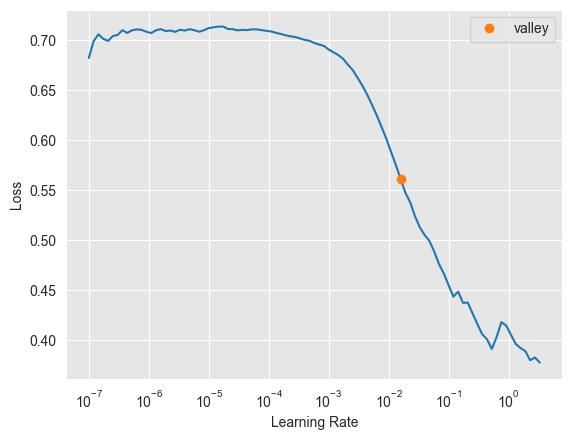

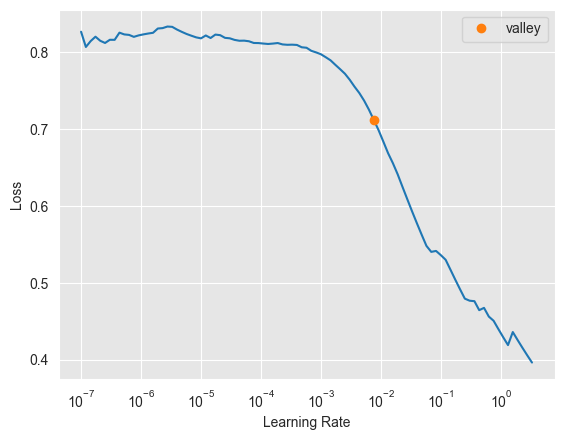

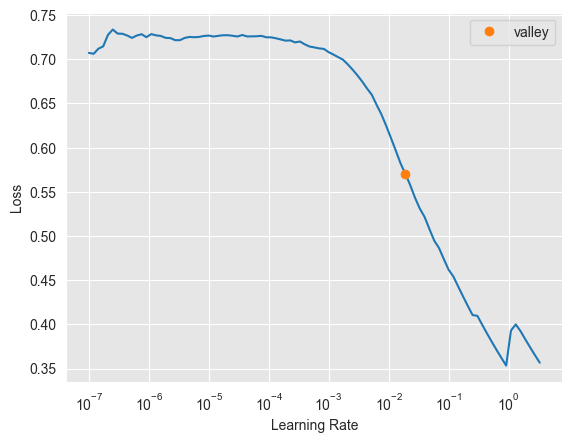

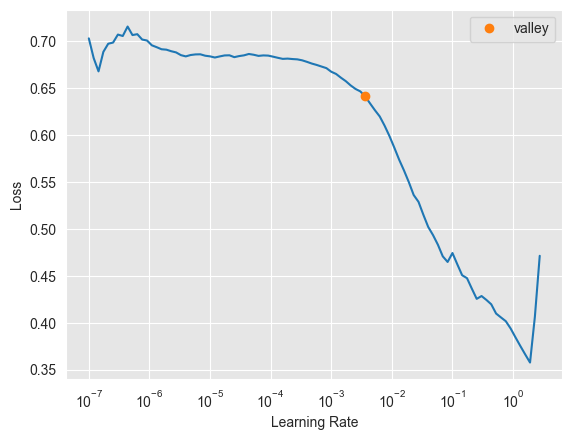

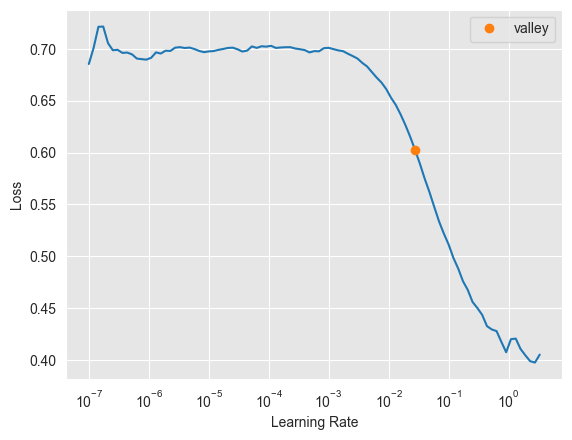

...

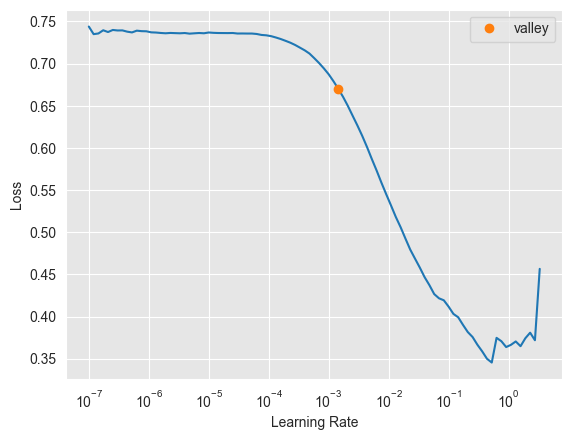

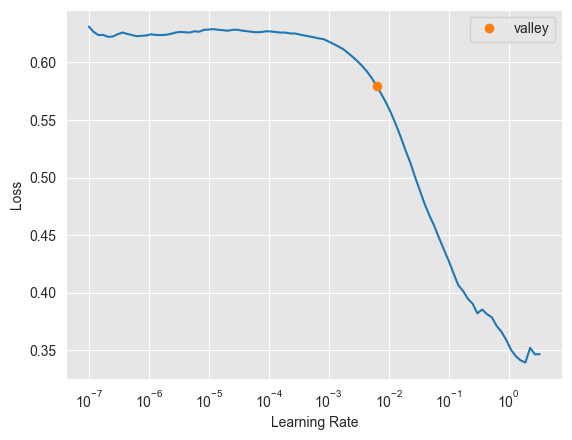

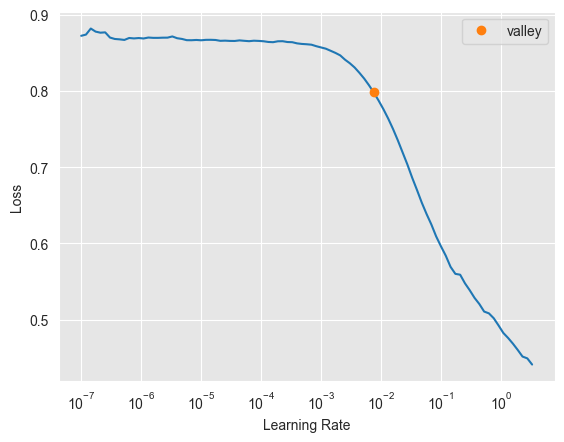

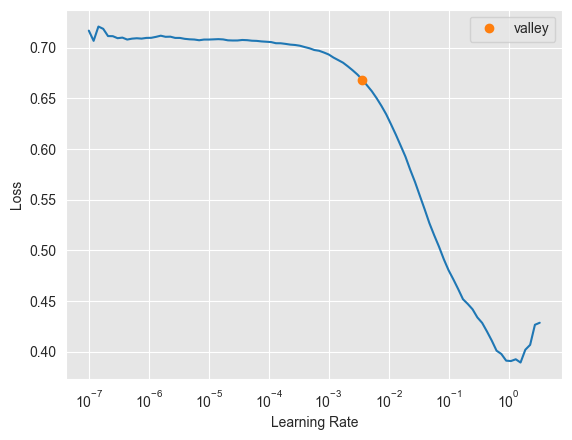

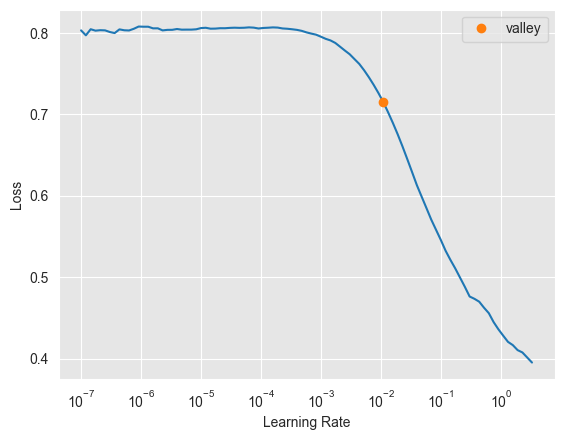

In [11]:
wandb.agent(sweep_id, train, count=60)

#### Fit 1 cycle

https://www.researchgate.net/publication/354235891_A_new_rotating_machinery_fault_diagnosis_method_based_on_the_Time_Series_Transformer

Hyperparameter search plane based on Table 4 (page 12) from the above paper


Ns - number of divided subsequences

L - input time series length

L/Ns - subsequences length

dim - dimension of the time series embedding dim

depth - the number of stacked Transformer basic blocks in the Transformer layer

h - the number of Head in MSA

dk - the dimension of queries and keys in MSA

dimMLP - the embedding dimension of the nonlinear transformation in MLP

pdrop - dropout probability

===

TSAI docs for TST (https://timeseriesai.github.io/tsai/models.tst.html) mention different usual values


In [23]:
sweep_config = {
                'method': 'random', 
                'metric': {
                    'goal': 'minimize',
                    'name': 'val_loss'
                    },
                'parameters': {
                    'one_cycle_policy' : {
                        'value' : True
                    },
                    'batch_size': {
                        'values' : [64, 128, 256]
                    },
                    'max_epochs': {
                        'values': [2, 3, 4, 5, 6, 7, 8, 9, 10]
                    },
                    'num_workers': {
                        'value' : 0
                    },
                    'seed': {
                        'value' : 42
                    },
                    'n_layers': { # depth
                        'values' : [1, 2, 3, 4, 5]
                    },
                    'd_model': { # dim
                        'values' : [16, 32, 64, 128]
                    },
                    'n_heads': { # h
                        'values' : [1, 2, 4, 16]
                    },
                    'd_k': { # dk (d_model / n_heads)
                        'values' : [None]
                    },
                    'd_v': { # d_model / n_heads 
                        'values' : [None]
                    },
                    'd_ff': { # dimMLP
                        'values' : [256, 128, 64, 32]
                    },
                    'dropout': { #pdrop
                        'values' : [0.1]
                    },
                    'act': {
                        'values' : ['gelu']
                    },
                    'fc_dropout': {
                        'values' : [0., ]
                    },
                }
 }

In [24]:
sweep_id = wandb.sweep(sweep_config, project="mgr-anomaly-tsxai-project")

Create sweep with ID: vphwt6mx
Sweep URL: https://wandb.ai/mgr-anomaly-tsxai/mgr-anomaly-tsxai-project/sweeps/vphwt6mx


In [25]:
def train(config=None):
    with wandb.init(project="mgr-anomaly-tsxai-project", config=config, tags=['tst', 'transformer', 'tsai', 'imbalance-not-considered', 'sweeps']):
        config = wandb.config
        training_execution_times = []
        prediction_execution_times = []
        aucs = []
        average_precisions = []
        f1_scores = []
        card_precisions = []
        for i in range(n_folds):
            train_df = prequential_split[i][0]
            valid_df = prequential_split[i][1]
            (train_df, valid_df)=scaleData(train_df, valid_df,input_features)
            x_train, y_train = prepare_sequenced_X_y(train_df, SEQ_LEN, input_features, output_feature)
            x_valid, y_valid = prepare_sequenced_X_y(valid_df, SEQ_LEN, input_features, output_feature)
            X, y, tsai_splits = tsai.all.combine_split_data([x_train.numpy(), x_valid.numpy()], [y_train.numpy(), y_valid.numpy()])
            dsets = tsai.all.TSDatasets(X, y, splits=tsai_splits, inplace=True)
            dls = tsai.all.TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=config.batch_size, num_workers=config.num_workers, device=DEVICE, drop_last=False)
            
            model = tsai.all.TST(
                c_in=dls.vars, 
                c_out=dls.c,
                seq_len=SEQ_LEN,
                n_layers=config.n_layers,
                d_model=config.d_model,
                n_heads=config.n_heads,
                d_k=config.d_k,
                d_v=config.d_v,
                d_ff=config.d_ff,
                dropout=config.dropout,
                act=config.act,
                fc_dropout=config.fc_dropout
            )
            
            criterion = tsai.all.BCEWithLogitsLossFlat()
            learn = tsai.all.ts_learner(
                dls,
                model,
                loss_func=criterion,
                opt_func=tsai.all.Adam,
                device=DEVICE,
                metrics=[],
                model_dir='TST',
                cbs=[
                    WandbCallback(
                        log=None,
                        log_model=False,
                        seed=config.seed)])

            valley = learn.lr_find().valley

            start_time=time.time()
            learn.fit_one_cycle(config.max_epochs, valley)
            training_execution_times.append(time.time()-start_time)

            start_time=time.time()
            valid_predictions_logits = get_predictions_sequential(learn.model.cuda(), dls.valid)
            prediction_execution_time=time.time()-start_time
            predictions_df = valid_df
            predictions_df['predictions'] = torch.nn.Sigmoid()(torch.FloatTensor(valid_predictions_logits)).numpy()
                
            performance_df = performance_assessment_f1_included(predictions_df, top_k_list=[100])
            aucs.append(performance_df.loc[0,'AUC ROC'])
            average_precisions.append(performance_df.loc[0,'Average precision'])
            f1_scores.append(performance_df.loc[0,'F1 score'])
            card_precisions.append(performance_df.loc[0,'Card Precision@100'])

        wandb.log({'Training execution time': np.sum(training_execution_times) / n_folds})
        wandb.log({'Prediction execution time': np.sum(prediction_execution_times) / n_folds})
        wandb.log({'AUC ROC': np.sum(aucs) / n_folds})
        wandb.log({'Average precision': np.sum(average_precisions) / n_folds})
        wandb.log({'F1 score': np.sum(f1_scores) / n_folds})
        wandb.log({'Card Precision@100': np.sum(card_precisions) / n_folds})

wandb: Agent Starting Run: sb0udrgr with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050490,0.035713,00:35
1,0.035296,0.035321,00:34
2,0.034654,0.031052,00:33
3,0.035705,0.030558,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025852,0.023593,00:35
1,0.020286,0.020812,00:36
2,0.020420,0.018677,00:35
3,0.020106,0.018195,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037533,0.023914,00:35
1,0.029967,0.018941,00:35
2,0.025260,0.017573,00:35
3,0.017651,0.017269,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041107,0.034954,00:35
1,0.034574,0.027611,00:34
2,0.040222,0.026106,00:34
3,0.029070,0.024801,00:34


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▁▂▂▂▁▁▁▁▁▁▁▂▂▂▁▁▁▁▁▂▃▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▂▁▁▁▁▁▁▁▁▆▁▁▁▂▁▁▁▁▁█▃▁▁▁▁▂▁▁▁▂▁▂▂▃▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xjl3fue9 with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032253,0.022813,00:34
1,0.030174,0.023428,00:34
2,0.033227,0.024204,00:33
3,0.019766,0.020778,00:34
4,0.012937,0.018752,00:34
5,0.018637,0.017686,00:34
6,0.015183,0.017555,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035861,0.031719,00:35
1,0.036470,0.034182,00:34
2,0.044932,0.037729,00:34
3,0.038803,0.037013,00:35
4,0.036503,0.033263,00:35
5,0.029262,0.031704,00:35
6,0.039735,0.031446,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033479,0.030367,00:34
1,0.053505,0.040018,00:34
2,0.043391,0.031922,00:34
3,0.045126,0.032565,00:33
4,0.046105,0.031889,00:35
5,0.041893,0.030502,00:34
6,0.038576,0.030963,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026457,0.022275,00:33
1,0.030303,0.020702,00:35
2,0.022875,0.018537,00:35
3,0.025067,0.020716,00:34
4,0.013285,0.017970,00:34
5,0.025582,0.017359,00:35
6,0.015660,0.017394,00:35


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▄▇▇▆▅▄▃▂▁▁▅██▇▆▄▃▂▁▁▂▃▃▃▂▂▁▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▇██
raw_loss,▆▂▁▄▂▁▅▁▁▁█▁▆▁█▁▁▂▁▁▃▅▃▁▁▁▁▁▂▂▅▁▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: d36kf6v4 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038925,0.023692,00:17
1,0.021787,0.021730,00:17
2,0.021665,0.018397,00:18
3,0.021381,0.018332,00:19
4,0.016895,0.018593,00:17
5,0.016835,0.017377,00:17
6,0.019585,0.017414,00:17
7,0.017455,0.017284,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031257,0.025221,00:17
1,0.028944,0.024921,00:18
2,0.027254,0.024929,00:17
3,0.029351,0.028577,00:17
4,0.029858,0.021807,00:17
5,0.021817,0.020856,00:17
6,0.016815,0.021228,00:17
7,0.023374,0.020826,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029839,0.022831,00:17
1,0.028174,0.020786,00:17
2,0.023678,0.019029,00:17
3,0.024560,0.019543,00:16
4,0.028000,0.017379,00:17
5,0.021351,0.017921,00:17
6,0.022244,0.016475,00:16
7,0.019364,0.016594,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029817,0.018203,00:17
1,0.028544,0.019259,00:17
2,0.022768,0.018389,00:17
3,0.022142,0.018020,00:17
4,0.019369,0.017060,00:16
5,0.020464,0.016590,00:17
6,0.014399,0.016175,00:17
7,0.017995,0.016301,00:17


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▂▂▂▂▂▁▁▁▂▆███▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁▂▃▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▂▁▁▁▁▁▂▂▁▂▁▁▂▁▂▁▂▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▂


wandb: Agent Starting Run: c9p4ogne with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 4
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030048,0.024785,00:27
1,0.027060,0.020849,00:27
2,0.026568,0.020950,00:27
3,0.025422,0.019223,00:27
4,0.020785,0.018252,00:27
5,0.018887,0.018128,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029174,0.025923,00:27
1,0.023779,0.023692,00:27
2,0.028344,0.023416,00:27
3,0.021070,0.020525,00:27
4,0.021939,0.019461,00:28
5,0.025686,0.019106,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026828,0.028226,00:27
1,0.031763,0.022158,00:28
2,0.026565,0.019820,00:27
3,0.022955,0.018346,00:28
4,0.023905,0.017259,00:27
5,0.022669,0.016844,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034682,0.031757,00:28
1,0.045439,0.027817,00:27
2,0.035048,0.026679,00:28
3,0.039038,0.025147,00:27
4,0.030473,0.024893,00:27
5,0.035414,0.024831,00:27


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▂▃▃▃▃▂▂▁▁▁▂▃▃▃▂▂▁▁▁▂▇█▇▇▅▄▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▆▂▁▁▁▁▂▁▁▁█▁▁▁▁▁▁▁▁▃▆▁▁▂▂▁▂▁▁▁▁▃▁▂▁▁▁▁▂▁


wandb: Agent Starting Run: nv953h5d with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035838,0.023263,00:12
1,0.024519,0.019964,00:12
2,0.020600,0.018065,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033514,0.028784,00:13
1,0.040199,0.037404,00:13
2,0.037476,0.032802,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044976,0.029497,00:13
1,0.042013,0.031277,00:13
2,0.039832,0.029552,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037636,0.022287,00:13
1,0.029467,0.020305,00:13
2,0.025785,0.017636,00:13


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▅▆▅▄▄▂▂▁▁▅██▇▆▄▃▂▁▂▄██▇▆▄▃▂▁▁▅▇▇▆▅▄▂▂▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▇▂▁▁▂▁▁▁▁▁▇▁▂▁▁▁▁▁▁▂▅▁▁▁▂▂▁▁▂▁█▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: a3gkcv4q with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 2
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051905,0.033983,00:23
1,0.040326,0.032794,00:24
2,0.036849,0.038519,00:23
3,0.036700,0.028648,00:23
4,0.031889,0.027481,00:24


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030954,0.027102,00:24
1,0.052907,0.036248,00:23
2,0.040018,0.038730,00:23
3,0.041335,0.036357,00:23
4,0.041525,0.034596,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.057031,0.039027,00:24
1,0.051203,0.036693,00:23
2,0.047159,0.033539,00:23
3,0.044564,0.031737,00:23
4,0.042787,0.030545,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055134,0.038955,00:24
1,0.042828,0.034422,00:23
2,0.037642,0.027585,00:23
3,0.039686,0.025742,00:23
4,0.032918,0.026312,00:23


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▄▃▂▁▁▂▄▄▃▃▂▂▁▁▂▆██▇▆▄▃▂▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▃▅▂▂▁▅▁▁▁▅█▁▃▁▃▁▄▁▁▂▂▁▁▄▂▂▁▂▂▅▁▂▅▁▁▂▂▃▄▁


wandb: Agent Starting Run: qoeax670 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045942,0.028222,00:09
1,0.027994,0.020873,00:10
2,0.023096,0.018770,00:09
3,0.021280,0.017723,00:09
4,0.018248,0.017270,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033746,0.028279,00:11
1,0.030356,0.026869,00:10
2,0.026992,0.024667,00:09
3,0.023260,0.021330,00:09
4,0.020595,0.021145,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.082133,0.036656,00:09
1,0.026936,0.022360,00:09
2,0.021524,0.018992,00:09
3,0.018896,0.018583,00:09
4,0.021322,0.018006,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.065129,0.025740,00:10
1,0.025017,0.017741,00:09
2,0.020323,0.017518,00:09
3,0.020269,0.016927,00:09
4,0.017860,0.016564,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▁▂▂▂▂▂▂▁▁▁▁▂▃▃▃▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▂▂▁▁▁▂▁▁▁▆▂▁▁▁▁▁▁▁▁▇▂▁▁▁▁▁▁▁▁█▁▁▁▁▁▂▁▂▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 61mq78rp with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052347,0.033457,00:35
1,0.043633,0.029719,00:35
2,0.036357,0.025855,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023190,0.022862,00:35
1,0.018304,0.020686,00:35
2,0.014109,0.018398,00:35


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041241,0.032883,00:34
1,0.027763,0.022092,00:35
2,0.020717,0.020705,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.021755,0.019564,00:34
1,0.023186,0.016993,00:34
2,0.026994,0.017267,00:35


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▂▂▂▂▂▂▁▁▁▁▄▅▅▄▄▃▂▁▁▁▃▃▃▃▂▂▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▂▂▁▁▂▅▁▁▁▂█▁▁▃▁▁▁▂▁▁▂▁▁▃▁▁▁▂▁▁▂▁▂▁▂▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 9avkqc95 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 1
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035066,0.023357,00:07
1,0.032678,0.040179,00:07
2,0.033398,0.022415,00:06
3,0.031129,0.026988,00:07
4,0.028313,0.021416,00:06
5,0.026730,0.020493,00:07
6,0.027777,0.020630,00:07
7,0.020820,0.018276,00:06
8,0.020093,0.018369,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036231,0.023080,00:06
1,0.029274,0.028169,00:07
2,0.029265,0.024397,00:06
3,0.026069,0.023389,00:06
4,0.026299,0.023384,00:06
5,0.023882,0.021038,00:06
6,0.023077,0.021030,00:07
7,0.017148,0.019900,00:06
8,0.017900,0.019433,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.085281,0.033584,00:06
1,0.022369,0.019430,00:07
2,0.025179,0.018323,00:06
3,0.022392,0.018654,00:07
4,0.024705,0.018315,00:07
5,0.018391,0.017133,00:07
6,0.018728,0.017323,00:07
7,0.019356,0.017136,00:07
8,0.018111,0.016961,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034723,0.020849,00:07
1,0.032988,0.025374,00:07
2,0.034085,0.025750,00:06
3,0.034996,0.046322,00:07
4,0.035208,0.021158,00:07
5,0.026640,0.020458,00:06
6,0.023085,0.019251,00:07
7,0.023671,0.018951,00:07
8,0.022135,0.018196,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▇▇▆▅▄▃▂▁▁▅▇▇▆▅▄▃▂▁▁▂▃▃▂▂▂▁▁▁▂▆██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▄▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▂▂▁▂▁▁▁▁▁▂▃▁▁▁▁▁▁▁▁▁█▁▁▁▂▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁


wandb: Agent Starting Run: eae777nz with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025796,0.025710,00:22
1,0.024152,0.018956,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031442,0.025585,00:22
1,0.024010,0.021522,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038627,0.023989,00:22
1,0.025693,0.021133,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028985,0.020869,00:21
1,0.023355,0.017960,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▅▅▅▄▃▂▁▁▁▅▇▇▆▅▄▃▂▁▁▅██▇▅▄▃▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▆▂▁▁▁▁▁▂▂▁▇▁▂▁▂▂▂▂▁▁█▂▂▁▁▁▂▁▁▁▅▁▁▁▁▂▁▂▁▁


wandb: Agent Starting Run: 7deprt5c with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 4
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028865,0.025632,00:27
1,0.036594,0.033213,00:26
2,0.036594,0.025800,00:27
3,0.039146,0.024182,00:27
4,0.034656,0.021849,00:28
5,0.027659,0.021616,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.018571,0.023702,00:27
1,0.023732,0.023552,00:27
2,0.021291,0.020599,00:27
3,0.022646,0.020089,00:27
4,0.021788,0.018693,00:26
5,0.013581,0.018167,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026416,0.021138,00:27
1,0.034144,0.021905,00:27
2,0.024886,0.021797,00:26
3,0.019241,0.019479,00:26
4,0.028230,0.018535,00:27
5,0.026570,0.017987,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035666,0.022681,00:27
1,0.031552,0.024054,00:27
2,0.034407,0.020025,00:28
3,0.032670,0.019038,00:28
4,0.023293,0.018322,00:27
5,0.021649,0.017821,00:27


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▂▃▃▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▅▆▆▅▄▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▁▃▄▃▂▁▂▂▂▁█▁▂▁▁▁▁▁▂▁▃▂▁▂▁▁▁▁▁▁▁▁▁▃▁▃▁▂▁▁


wandb: Agent Starting Run: 8hmt1ge5 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035583,0.024155,00:06
1,0.025008,0.018982,00:06
2,0.023003,0.017762,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039533,0.022624,00:07
1,0.022693,0.019829,00:07
2,0.020723,0.019076,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041032,0.021422,00:07
1,0.024227,0.018620,00:07
2,0.018791,0.017366,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046596,0.020487,00:07
1,0.025591,0.017854,00:07
2,0.022139,0.017012,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▂▃▃▃▃▂▂▁▁▁▂▄▄▃▃▂▂▁▁▁▂▃▃▂▂▂▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▁▁▂▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁▇▂▁▁▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: os8cxx9c with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 16
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040776,0.031348,00:35
1,0.035667,0.031908,00:38
2,0.029313,0.022617,00:36
3,0.031196,0.022270,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026181,0.022916,00:36
1,0.030885,0.021304,00:35
2,0.015582,0.020148,00:35
3,0.021163,0.018778,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027921,0.019666,00:35
1,0.018395,0.019061,00:36
2,0.023655,0.017340,00:35
3,0.024120,0.016872,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040458,0.024942,00:35
1,0.035690,0.020581,00:36
2,0.028513,0.020474,00:36
3,0.019577,0.017710,00:36


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▄▄▄▃▂▂▁▁▁▂▃▃▂▂▂▁▁▁▂▄▇▇▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▁▂▁▁▁▂▁▃▁▄▁▁▁▁▁▁▁▁▁█▁▂▁▁▁▁▂▁▁▁▁▁▂▁▂▂▁▁▁


wandb: Agent Starting Run: napvnikk with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 16
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043500,0.022028,00:06
1,0.030510,0.025565,00:07
2,0.025909,0.020529,00:07
3,0.027500,0.020063,00:07
4,0.023984,0.020366,00:07
5,0.022695,0.018389,00:07
6,0.022651,0.017725,00:07
7,0.019444,0.017232,00:07
8,0.019558,0.017391,00:07
9,0.019400,0.017249,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.114008,0.032576,00:07
1,0.025401,0.023363,00:08
2,0.023877,0.021380,00:07
3,0.019407,0.019723,00:07
4,0.020435,0.018658,00:07
5,0.018548,0.018959,00:07
6,0.018532,0.018407,00:07
7,0.018117,0.018048,00:07
8,0.017020,0.018044,00:07
9,0.016945,0.018006,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.091496,0.029021,00:07
1,0.027294,0.020886,00:07
2,0.025044,0.018896,00:06
3,0.024482,0.017909,00:07
4,0.022717,0.018116,00:07
5,0.020518,0.016803,00:07
6,0.019421,0.017155,00:07
7,0.017943,0.016693,00:07
8,0.019637,0.016459,00:08
9,0.019049,0.016470,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.078029,0.024677,00:07
1,0.024930,0.019192,00:07
2,0.025451,0.017425,00:07
3,0.021122,0.017771,00:07
4,0.022858,0.018358,00:06
5,0.018911,0.016659,00:06
6,0.019294,0.015987,00:06
7,0.019857,0.016249,00:07
8,0.018868,0.015848,00:07
9,0.017589,0.015852,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁▁▃▃▃▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▂▆▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 9cegq9ts with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 4
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036961,0.028072,00:13
1,0.036092,0.026009,00:14
2,0.025821,0.020065,00:14
3,0.021389,0.019519,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033197,0.026358,00:14
1,0.029905,0.030738,00:14
2,0.027442,0.023103,00:15
3,0.024714,0.022166,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040938,0.038754,00:14
1,0.043079,0.035267,00:14
2,0.037267,0.027464,00:14
3,0.038660,0.027250,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035852,0.031518,00:15
1,0.026334,0.025334,00:14
2,0.023440,0.016895,00:14
3,0.019344,0.016324,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▆▆▅▄▄▂▁▁▂▅▇▇▆▅▄▃▂▁▁▅██▇▅▄▃▂▁▂▃▅▅▄▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▂▂▁▂▁▁▂▃▁▅▂▁▂▁▁▁▂▁▁█▂▁▂▂▁▂▁▁▂▄▂▂▁▂▁▁▁▁▂


wandb: Agent Starting Run: iwonot19 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 4
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031302,0.021678,00:07
1,0.021431,0.019025,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031949,0.023999,00:07
1,0.019270,0.019284,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034220,0.025156,00:07
1,0.025417,0.019095,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031635,0.020601,00:07
1,0.022667,0.017788,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▄▄▄▃▂▂▁▁▁▅██▇▅▄▃▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▄▁▂▁▁▁▁▁▁▁▇▁▁▁▁▁▁▁▁▁█▁▁▁▂▁▁▁▁▂▅▂▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qulewwgh with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054592,0.021811,00:10
1,0.023081,0.018511,00:11
2,0.025805,0.018964,00:11
3,0.023585,0.018427,00:11
4,0.021946,0.018481,00:11
5,0.018567,0.017639,00:11
6,0.016053,0.017258,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055441,0.024791,00:11
1,0.022628,0.021864,00:11
2,0.022570,0.018951,00:12
3,0.017747,0.019037,00:11
4,0.019478,0.018354,00:11
5,0.016870,0.017875,00:11
6,0.017149,0.017892,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.068302,0.026446,00:12
1,0.025389,0.021330,00:11
2,0.027235,0.018700,00:12
3,0.024298,0.017964,00:11
4,0.020697,0.016820,00:11
5,0.017444,0.016562,00:11
6,0.019928,0.016472,00:11


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047196,0.020599,00:11
1,0.027321,0.018240,00:11
2,0.027611,0.018829,00:11
3,0.022352,0.017987,00:11
4,0.020185,0.018465,00:11
5,0.020594,0.016466,00:11
6,0.019032,0.016323,00:11


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▆▇▆▅▄▃▂▁▁▃▅▅▄▄▃▂▁▁▁▄▆▆▅▄▃▂▁▁▂▆██▇▅▄▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▇██
raw_loss,▇▁▁▁▁▁▂▁▁▁█▁▂▂▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▅▁▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: yr4xdes9 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026794,0.020075,00:09
1,0.024918,0.019358,00:09
2,0.022944,0.017847,00:09
3,0.024199,0.017738,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024204,0.021607,00:09
1,0.017229,0.020895,00:09
2,0.017312,0.019268,00:09
3,0.020069,0.018446,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028430,0.027894,00:10
1,0.032196,0.020804,00:09
2,0.023138,0.018264,00:09
3,0.021090,0.018184,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033897,0.021655,00:09
1,0.025606,0.017427,00:09
2,0.018829,0.016896,00:09
3,0.017787,0.016946,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▄▄▄▃▃▂▁▁▁▃▃▃▃▃▂▂▁▁▁▅██▇▅▄▃▂▁▂▃▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▄▁▁▁▁▃▁▁▁▂█▁▁▂▂▂▁▂▂▁█▃▁▁▂▁▁▂▁▁▃▃▁▁▃▁▁▂▂▁


wandb: Agent Starting Run: wteqh51o with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 16
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027323,0.025927,00:13
1,0.025298,0.020819,00:13
2,0.023682,0.018955,00:13
3,0.027257,0.021044,00:13
4,0.021070,0.018513,00:13
5,0.018527,0.017798,00:13
6,0.018877,0.017225,00:13
7,0.018076,0.017202,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039033,0.026853,00:13
1,0.019747,0.023739,00:13
2,0.020535,0.022013,00:13
3,0.017870,0.019571,00:13
4,0.017102,0.018882,00:13
5,0.020480,0.018444,00:13
6,0.017614,0.018087,00:13
7,0.017255,0.018037,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033917,0.023128,00:13
1,0.028692,0.020114,00:13
2,0.023407,0.017890,00:13
3,0.019586,0.018191,00:13
4,0.019454,0.017175,00:13
5,0.019968,0.016958,00:13
6,0.019034,0.016834,00:13
7,0.016295,0.016781,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029999,0.022539,00:13
1,0.023020,0.021076,00:13
2,0.021978,0.021680,00:13
3,0.025582,0.019939,00:13
4,0.023510,0.017187,00:13
5,0.022771,0.016360,00:13
6,0.017914,0.016570,00:14
7,0.017577,0.016516,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▁▂▃▃▃▂▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▁▁▁▁▁▂▁▂▁▆▁▁▂▁▁▁▁▂▁█▁▁▂▁▁▂▂▁▂▁▁▂▁▁▁▂▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: d0yww99n with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041537,0.022021,00:07
1,0.027292,0.022225,00:06
2,0.022787,0.020843,00:06
3,0.024569,0.020143,00:06
4,0.025278,0.018704,00:07
5,0.022149,0.018413,00:06
6,0.017992,0.017493,00:07
7,0.019054,0.017481,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053642,0.025795,00:06
1,0.024972,0.021603,00:08
2,0.023564,0.020190,00:07
3,0.021367,0.019184,00:07
4,0.021041,0.019082,00:06
5,0.019774,0.018463,00:06
6,0.016616,0.017982,00:07
7,0.016358,0.017944,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.064417,0.029346,00:07
1,0.028783,0.021156,00:07
2,0.023744,0.019705,00:07
3,0.023127,0.018640,00:06
4,0.022544,0.017069,00:06
5,0.020406,0.017357,00:07
6,0.020170,0.017237,00:06
7,0.018483,0.016970,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045632,0.022887,00:07
1,0.025235,0.020182,00:07
2,0.023838,0.023267,00:07
3,0.028737,0.017494,00:07
4,0.020973,0.017619,00:07
5,0.022016,0.017724,00:06
6,0.020028,0.017015,00:07
7,0.018322,0.016758,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▄▅▅▅▄▃▂▁▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▂▁▂▁▁▁▁▆▁▁▂▂▁▁▁▁▁█▁▁▁▁▁▁▁▁▂▂▁▁▁▂▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jt511mh6 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032428,0.022361,00:13
1,0.021517,0.018227,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031284,0.025425,00:14
1,0.019849,0.019696,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032456,0.022710,00:15
1,0.025485,0.018554,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035079,0.029750,00:14
1,0.029422,0.019521,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▅▅▅▄▃▂▁▁▁▄▅▅▅▄▃▂▁▁▁▄▆▆▅▄▃▂▂▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▆▂▁▂▁▁▁▁▁▁▇▂▁▁▂▁▁▁▁▁█▂▁▁▁▁▁▁▁▂▄▁▂▂▂▁▁▂▁▁


wandb: Agent Starting Run: s9hdw3uf with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020683,0.026178,00:36
1,0.029989,0.026850,00:36
2,0.024031,0.021553,00:36
3,0.019771,0.021231,00:36
4,0.022169,0.018333,00:37
5,0.020897,0.018744,00:38


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036812,0.034176,00:37
1,0.034021,0.032385,00:37
2,0.029753,0.027091,00:37
3,0.022727,0.027062,00:38
4,0.017334,0.022531,00:37
5,0.026461,0.021485,00:37


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042139,0.035737,00:37
1,0.052015,0.033257,00:36
2,0.047204,0.032390,00:38
3,0.046181,0.029980,00:37
4,0.053328,0.030224,00:37
5,0.053537,0.029929,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038617,0.022611,00:36
1,0.035864,0.027661,00:37
2,0.041234,0.022852,00:36
3,0.032760,0.022123,00:36
4,0.023102,0.019399,00:37
5,0.020622,0.019886,00:38


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▃▄▄▄▃▃▂▁▁▂▆██▇▅▄▂▂▁▁▃▄▄▃▃▂▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▄▁▁▁▁▁▄▁▁▁█▂▁▄▁▁▁▁▁▁▂▁▁▄▅▃▃▁▁▄▁▁▁▃▁▃▂▁▁▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 0qyuf2tp with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 4
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028457,0.022458,00:15
1,0.026615,0.021565,00:15
2,0.024503,0.021512,00:15
3,0.025827,0.020127,00:15
4,0.023834,0.019186,00:15
5,0.018809,0.017902,00:15
6,0.023670,0.017981,00:15
7,0.018094,0.017611,00:15
8,0.018861,0.017658,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028449,0.026869,00:15
1,0.024222,0.025214,00:15
2,0.021444,0.023141,00:15
3,0.022378,0.023287,00:15
4,0.021430,0.020257,00:15
5,0.017788,0.021460,00:15
6,0.019694,0.019029,00:15
7,0.018566,0.018755,00:15
8,0.020270,0.018815,00:15


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033276,0.022662,00:15
1,0.022791,0.020633,00:15
2,0.027751,0.019929,00:15
3,0.027396,0.017704,00:16
4,0.024619,0.018257,00:15
5,0.024422,0.017240,00:15
6,0.019782,0.016549,00:15
7,0.018326,0.016593,00:15
8,0.017073,0.016663,00:15


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024825,0.020181,00:14
1,0.024501,0.019726,00:14
2,0.025802,0.017733,00:14
3,0.020293,0.018434,00:14
4,0.018738,0.016866,00:14
5,0.014353,0.017547,00:14
6,0.020358,0.016993,00:14
7,0.017790,0.015924,00:14
8,0.015658,0.016113,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▄▃▂▁▁▅██▇▆▄▃▂▁▁▃▆▆▅▄▃▂▂▁▂▅▇▇▆▅▄▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▂▁▂▂▁▁▁▁▂▁▃▁▁▁▂▁▁▁▂▁█▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▂▂▁


wandb: Agent Starting Run: 4vjckl41 with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036782,0.036167,00:43
1,0.023337,0.021199,00:43
2,0.019509,0.018957,00:44
3,0.020531,0.017650,00:45


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042943,0.037973,00:44
1,0.039522,0.035993,00:44
2,0.035837,0.033121,00:44
3,0.034624,0.031814,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023300,0.028904,00:43
1,0.024711,0.019406,00:43
2,0.025294,0.018608,00:46
3,0.024570,0.017081,00:44


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026403,0.026838,00:43
1,0.016440,0.020079,00:43
2,0.017343,0.017619,00:44
3,0.014378,0.016593,00:43


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▂▂▁▁▁▁▁▁▂▆███▆▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▁▁▁▁▁▂▁▁▁▁▂▂▁▂▁▁█▂▁▁▁▁▁▁▁▃▃▁▁▁▁▁▁▁▁▂


wandb: Agent Starting Run: mlj01ub8 with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051531,0.036339,00:52
1,0.039513,0.027870,00:53


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048248,0.038266,00:55
1,0.038437,0.031583,00:53


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.056497,0.038282,00:53
1,0.045578,0.032981,00:52


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039464,0.027816,00:52
1,0.034423,0.025843,00:51


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▃▃▂▂▁▁▁▃▄▄▄▃▃▂▁▁▁▅██▇▅▄▃▂▁▁▂▃▃▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▂▅▁▁▁▁▃▄▁▂▁▁▁▁▁▅▄▅▁▁▃█▃▂▁▁▁▃▄▂▃▃▃▂▂▄▁


wandb: Agent Starting Run: jpqrernt with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 1
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042629,0.022640,00:06
1,0.027024,0.020049,00:06
2,0.022862,0.020541,00:06
3,0.019579,0.018501,00:06
4,0.016020,0.017459,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034464,0.025751,00:06
1,0.024603,0.024027,00:06
2,0.024241,0.021880,00:06
3,0.019059,0.019639,00:06
4,0.019546,0.019059,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036810,0.021768,00:06
1,0.025735,0.020696,00:06
2,0.020935,0.019674,00:07
3,0.023545,0.017709,00:06
4,0.021445,0.017464,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070282,0.027569,00:07
1,0.024853,0.019303,00:06
2,0.021215,0.017483,00:07
3,0.018765,0.016773,00:07
4,0.020628,0.016746,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▄▅▅▄▄▃▂▁▁▁▅██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▂▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁▃▁▁▁▁▂▁▁▁▁█▂▁▂▁▁▁▁▁▁


wandb: Agent Starting Run: eivnjptj with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026589,0.020910,00:13
1,0.033518,0.023440,00:13
2,0.020463,0.021824,00:13
3,0.024894,0.020243,00:13
4,0.023482,0.017972,00:13
5,0.019016,0.017701,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033108,0.048152,00:13
1,0.034065,0.029132,00:13
2,0.029549,0.023522,00:13
3,0.024902,0.021802,00:14
4,0.023055,0.020593,00:13
5,0.025300,0.020427,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030014,0.020696,00:13
1,0.022179,0.019435,00:13
2,0.029142,0.021182,00:13
3,0.023856,0.017495,00:13
4,0.020266,0.016696,00:13
5,0.022191,0.016635,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030565,0.020039,00:14
1,0.026724,0.021629,00:13
2,0.027466,0.021891,00:13
3,0.023908,0.018334,00:13
4,0.022172,0.017425,00:13
5,0.023674,0.017331,00:13


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▆▅▄▄▂▂▁▁▅██▇▆▅▃▂▁▁▃▃▃▃▂▂▂▁▁▂▅▆▆▅▄▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▂▁▁▁▁▁▂▁▁▂█▁▁▂▂▁▂▁▁▁▅▂▂▁▂▂▁▁▁▁▁▁▁▁▃▁▂▁▁▂


wandb: Agent Starting Run: bjffverg with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036919,0.024737,00:09
1,0.028766,0.026160,00:09
2,0.022944,0.021393,00:09
3,0.023598,0.019105,00:09
4,0.018262,0.018793,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035525,0.025424,00:09
1,0.024058,0.032872,00:09
2,0.023980,0.022686,00:09
3,0.024220,0.020278,00:10
4,0.016057,0.018956,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046460,0.024075,00:09
1,0.024248,0.019539,00:09
2,0.024750,0.017996,00:10
3,0.022702,0.018007,00:09
4,0.020955,0.017518,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040905,0.022415,00:09
1,0.025668,0.021763,00:09
2,0.024070,0.024006,00:09
3,0.021069,0.016474,00:09
4,0.018142,0.016685,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▄▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▄▁▁▂▁▁▁▁▁▁█▂▁▁▁▁▂▁▁▁▅▁▂▂▁▁▁▁▁▂▆▂▁▂▂▁▂▁▁▁


wandb: Agent Starting Run: hgw5s3nr with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026688,0.021727,00:09
1,0.028487,0.020992,00:09
2,0.022043,0.021824,00:10
3,0.028449,0.020054,00:10
4,0.023259,0.019358,00:10
5,0.021028,0.018570,00:09
6,0.021267,0.017862,00:09
7,0.018649,0.017469,00:09
8,0.016268,0.017121,00:09
9,0.017609,0.017162,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020680,0.024078,00:09
1,0.025071,0.025437,00:09
2,0.023846,0.028491,00:09
3,0.025606,0.023780,00:09
4,0.021742,0.021256,00:09
5,0.023972,0.019782,00:09
6,0.015512,0.021230,00:09
7,0.020162,0.018103,00:09
8,0.015880,0.018314,00:09
9,0.018298,0.018274,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034940,0.023663,00:09
1,0.030410,0.021499,00:09
2,0.028124,0.019426,00:09
3,0.022606,0.019717,00:09
4,0.021125,0.019231,00:09
5,0.025413,0.019449,00:09
6,0.021852,0.018579,00:09
7,0.018237,0.017250,00:09
8,0.021771,0.017412,00:09
9,0.017225,0.017244,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030863,0.023041,00:09
1,0.025031,0.024809,00:09
2,0.029492,0.019128,00:10
3,0.029003,0.022316,00:09
4,0.024025,0.017758,00:09
5,0.020897,0.019558,00:09
6,0.022139,0.017404,00:09
7,0.016443,0.017469,00:10
8,0.020393,0.016403,00:09
9,0.018718,0.016556,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▄▇▇▆▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▄▁▁▆▁▄▂▁▁▃█▄▂▃▁▅▁▁▁▄▂▂▁▇▅▁▁▁▂▄▃▁▄▁▂▁▂▂▄▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jzdlud1y with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031785,0.033029,00:43
1,0.049096,0.034357,00:43
2,0.041076,0.031126,00:43
3,0.039278,0.028382,00:44
4,0.046558,0.032424,00:44
5,0.039881,0.030393,00:43
6,0.040281,0.030153,00:44


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028043,0.032266,00:43
1,0.033461,0.033632,00:43
2,0.028225,0.034592,00:43
3,0.042566,0.029402,00:44
4,0.033979,0.028626,00:44
5,0.029779,0.028973,00:44
6,0.027243,0.029234,00:44


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033332,0.021828,00:43
1,0.025083,0.025366,00:43
2,0.030648,0.022852,00:43
3,0.021288,0.020266,00:43
4,0.020369,0.017815,00:43
5,0.026349,0.017610,00:43
6,0.015515,0.017048,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026916,0.019739,00:43
1,0.035521,0.030524,00:44
2,0.031999,0.024633,00:43
3,0.031449,0.020456,00:43
4,0.024964,0.019314,00:44
5,0.022778,0.018885,00:43
6,0.019989,0.018493,00:44


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▄▇▇▆▅▄▃▂▁▁▂▃▃▃▃▂▂▁▁▁▃▄▄▄▃▂▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▇██
raw_loss,▆▁▁▂▁▁▁▅▂▂█▁▁▁▁▁▁▅▂▁█▂▁▁▁▁▁▁▁▁▂▁▁▁▇▁▂▁▁▄


wandb: Agent Starting Run: p1tp9ezi with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031870,0.022711,00:18
1,0.030431,0.024761,00:18
2,0.022894,0.022681,00:18
3,0.026847,0.021690,00:18
4,0.025729,0.018956,00:18
5,0.024506,0.019056,00:19
6,0.024994,0.018664,00:18
7,0.016853,0.018147,00:18
8,0.020353,0.017787,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030495,0.026896,00:19
1,0.030408,0.024631,00:18
2,0.029443,0.025944,00:18
3,0.032773,0.026240,00:18
4,0.027654,0.024692,00:18
5,0.024582,0.021318,00:18
6,0.025416,0.021727,00:18
7,0.022409,0.019337,00:18
8,0.016521,0.019173,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029525,0.020866,00:18
1,0.040676,0.034128,00:18
2,0.041498,0.039136,00:18
3,0.037235,0.029166,00:18
4,0.038452,0.027524,00:18
5,0.030900,0.023810,00:18
6,0.030263,0.023557,00:18
7,0.022152,0.022790,00:18
8,0.024869,0.023026,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028925,0.023757,00:19
1,0.030182,0.020258,00:19
2,0.027655,0.018782,00:19
3,0.031008,0.025640,00:18
4,0.027749,0.019333,00:18
5,0.021307,0.018819,00:19
6,0.018752,0.017824,00:19
7,0.021479,0.017505,00:18
8,0.015621,0.017490,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▃▂▁▁▁▄▆▆▅▅▃▂▁▁▁▄██▇▆▄▃▂▁▁▄▅▅▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▂▂▂▁▃▂▂▂▁▂▄▁▂▁▁▁▁▁▁▁█▁▁▁▂▁▁▂▂▁▂▁▂▁▁▁▁▁▁▂


wandb: Agent Starting Run: 4u9v36pw with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.057036,0.042883,00:51
1,0.051469,0.040952,00:51
2,0.055848,0.039799,00:52


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055126,0.041909,00:51
1,0.040859,0.038772,00:52
2,0.039926,0.035275,00:51


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050473,0.040144,00:51
1,0.049119,0.033346,00:52
2,0.045188,0.032519,00:52


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042494,0.026442,00:51
1,0.043294,0.032766,00:50
2,0.049093,0.024943,00:50


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▆▇▆▅▄▃▂▁▁▂▃▃▃▃▂▂▁▁▂▆██▇▅▄▂▂▁▁▂▃▂▂▂▂▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▁▁▃▁▃▁▁▃▃▁█▁▁▁▁▃▁▁▁▃▃▃▁▁▁▄▁▁▄▁▃▁▁▄▁▃▁▁▁▂


wandb: Agent Starting Run: a73si7s1 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052121,0.023077,00:04
1,0.027258,0.019318,00:04
2,0.022729,0.019051,00:04
3,0.018791,0.018011,00:04
4,0.020681,0.017337,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036882,0.024887,00:04
1,0.022659,0.019901,00:04
2,0.020376,0.019670,00:04
3,0.019198,0.018649,00:04
4,0.017404,0.018284,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.055525,0.024079,00:04
1,0.026788,0.020309,00:04
2,0.022713,0.018152,00:05
3,0.022008,0.017584,00:05
4,0.020558,0.017375,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045754,0.019925,00:04
1,0.023074,0.018968,00:05
2,0.020997,0.017167,00:04
3,0.018357,0.016361,00:04
4,0.019434,0.016367,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▄▃▃▂▁▁▁▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▃▅▅▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▇▂▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▇▁▁▁▁▁▁▁▁▁▇▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: d4yeios8 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 2
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054422,0.025887,00:07
1,0.028795,0.021644,00:07
2,0.023779,0.019553,00:07
3,0.025282,0.019483,00:06
4,0.026437,0.020026,00:06
5,0.022879,0.019215,00:06
6,0.019532,0.017869,00:06
7,0.019182,0.017302,00:06
8,0.017623,0.017429,00:06
9,0.017990,0.017208,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.063723,0.029154,00:07
1,0.022475,0.021576,00:07
2,0.023657,0.020247,00:07
3,0.021763,0.020517,00:06
4,0.018937,0.020131,00:06
5,0.019217,0.018918,00:07
6,0.016731,0.019633,00:06
7,0.017285,0.018133,00:06
8,0.018708,0.018028,00:07
9,0.016023,0.017988,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.098457,0.034710,00:07
1,0.027369,0.019975,00:07
2,0.023333,0.019101,00:07
3,0.025281,0.019191,00:07
4,0.025157,0.018754,00:06
5,0.022476,0.017294,00:07
6,0.020649,0.017194,00:07
7,0.020433,0.017127,00:06
8,0.018052,0.017022,00:06
9,0.016522,0.017184,00:06


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052329,0.025086,00:06
1,0.027022,0.019172,00:06
2,0.026393,0.017858,00:06
3,0.024069,0.019841,00:07
4,0.022823,0.017361,00:06
5,0.022617,0.017097,00:07
6,0.021458,0.018400,00:07
7,0.020353,0.016812,00:07
8,0.018499,0.015637,00:06
9,0.016175,0.015764,00:06


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▆▆▅▅▄▃▂▁▁▃▄▄▄▃▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▃▁▁▂▁▂▂▁▁▁█▂▁▂▁▁▁▁▁▂▅▁▁▁▁▁▁▁▁▁▄▂▂▁▁▁▁▁▁▂


wandb: Agent Starting Run: uasxvs3f with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.024422,0.023813,00:27
1,0.029084,0.020919,00:28
2,0.038180,0.031427,00:27
3,0.030703,0.022914,00:28
4,0.030083,0.024391,00:28
5,0.027957,0.021801,00:28
6,0.024944,0.019565,00:28
7,0.021138,0.018385,00:28
8,0.017467,0.018160,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043538,0.042746,00:28
1,0.054664,0.045470,00:27
2,0.045452,0.037556,00:27
3,0.036228,0.034182,00:27
4,0.044650,0.036118,00:27
5,0.041610,0.036393,00:27
6,0.038886,0.034999,00:27
7,0.035253,0.037215,00:27
8,0.037045,0.037314,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028246,0.021968,00:27
1,0.049007,0.033195,00:28
2,0.056498,0.037421,00:32
3,0.046791,0.034795,00:28
4,0.039688,0.031345,00:27
5,0.038836,0.030003,00:27
6,0.039004,0.030843,00:27
7,0.043881,0.030125,00:27
8,0.038859,0.029538,00:27


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028966,0.023760,00:27
1,0.043137,0.033101,00:26
2,0.044220,0.030247,00:26
3,0.042645,0.031678,00:27
4,0.040469,0.027745,00:27
5,0.037600,0.027765,00:27
6,0.039877,0.028345,00:27
7,0.032935,0.027228,00:27
8,0.037753,0.027921,00:27


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▂▂▂▂▁▁▁▁▁▅██▇▆▄▃▂▁▁▃▄▄▄▃▂▂▁▁▁▃▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▃▃▁▄▂▂▁▂▂▁▃▂▂▁▃▂▁▂▃▁█▂▂▃▁▁▂▁▂▂▁▁▁▂▂▂▁▃▃▂


wandb: Agent Starting Run: w2cg74r1 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 2
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032906,0.022839,00:22
1,0.026339,0.025143,00:22
2,0.021387,0.020338,00:22
3,0.023744,0.018836,00:22
4,0.024301,0.018235,00:22
5,0.017768,0.017999,00:22
6,0.021330,0.017095,00:21
7,0.015845,0.017357,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028216,0.023581,00:21
1,0.043939,0.043134,00:22
2,0.049007,0.036585,00:22
3,0.040161,0.034108,00:21
4,0.034286,0.035581,00:21
5,0.037716,0.031915,00:22
6,0.037479,0.030653,00:21
7,0.029853,0.030198,00:21


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031675,0.022355,00:21
1,0.032083,0.021914,00:21
2,0.024135,0.020620,00:21
3,0.021227,0.018174,00:22
4,0.024020,0.018253,00:22
5,0.023959,0.017587,00:22
6,0.021072,0.016833,00:23
7,0.020270,0.016831,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031305,0.022864,00:22
1,0.044895,0.028436,00:22
2,0.045989,0.026083,00:22
3,0.045538,0.035768,00:22
4,0.041714,0.028017,00:21
5,0.038570,0.024974,00:22
6,0.035908,0.024048,00:22
7,0.028439,0.024363,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▂▂▂▁▁▁▄▆▆▅▄▃▃▂▁▁▂▃▃▃▂▂▁▁▁▂▄██▇▆▄▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▁▂▂▁▁▁▂▁▄▂▁▁▂▁▁▂█▁▁▂▁▁▂▂▂▁▂▂▂▁▃▁▁▁▃▂


wandb: Agent Starting Run: bmbhb8fa with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027895,0.027230,00:22
1,0.025819,0.019412,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032097,0.038870,00:22
1,0.026915,0.025572,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030933,0.019993,00:23
1,0.026501,0.018351,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026457,0.018876,00:23
1,0.019035,0.016686,00:23


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▂▆███▆▄▃▂▁▁▅▇▇▆▅▄▂▂▁▁▂▃▃▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▂▂▂▁▁▁▂▁▁▅▁▁▁▂▂▁▂▁▁█▂▁▂▂▁▂▁▂▁▅▂▁▁▁▂▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: r5fvp1jh with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030652,0.021644,00:22
1,0.024989,0.019817,00:22
2,0.019811,0.019043,00:22
3,0.018670,0.017580,00:22
4,0.022018,0.017622,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029303,0.023698,00:21
1,0.032778,0.026059,00:24
2,0.031105,0.033793,00:22
3,0.026827,0.024620,00:22
4,0.028797,0.022969,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033577,0.039862,00:22
1,0.049509,0.036676,00:22
2,0.038677,0.026033,00:22
3,0.033899,0.026362,00:22
4,0.035710,0.026512,00:22


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037727,0.056072,00:22
1,0.031434,0.021308,00:22
2,0.029639,0.023473,00:22
3,0.025376,0.019461,00:22
4,0.029095,0.019319,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▄▇▇▆▅▄▃▂▁▂▆██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,█▁▃▁▁▁▁▁▃▁█▂▃▂▁▁▂▁▂▃▂▂▄▁▁▂▃▁▂▃▇▂▂▁▁▃▁▁▁▂


wandb: Agent Starting Run: pn3xbvp1 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 16
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053818,0.026010,00:04
1,0.024769,0.020825,00:04
2,0.024033,0.023830,00:04
3,0.023411,0.018395,00:04
4,0.020307,0.018278,00:04
5,0.019606,0.018889,00:04
6,0.019256,0.017577,00:04
7,0.017698,0.017784,00:05
8,0.017385,0.017210,00:04
9,0.014830,0.017173,00:05


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046655,0.026532,00:06
1,0.023218,0.022980,00:05
2,0.023672,0.019496,00:05
3,0.020563,0.023047,00:05
4,0.021226,0.020834,00:04
5,0.019276,0.018495,00:04
6,0.019451,0.018381,00:05
7,0.017140,0.018330,00:04
8,0.015733,0.018070,00:04
9,0.016275,0.018081,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050126,0.023759,00:05
1,0.028277,0.019640,00:04
2,0.027880,0.020990,00:04
3,0.027417,0.021510,00:04
4,0.021798,0.017943,00:04
5,0.022231,0.017833,00:04
6,0.020518,0.017619,00:04
7,0.018656,0.017152,00:04
8,0.019642,0.017446,00:04
9,0.017960,0.017137,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.073559,0.025807,00:04
1,0.026681,0.019104,00:04
2,0.021905,0.018274,00:04
3,0.022139,0.018249,00:05
4,0.022397,0.017673,00:04
5,0.021151,0.016465,00:04
6,0.019927,0.015732,00:04
7,0.018136,0.016351,00:05
8,0.018884,0.016775,00:05
9,0.015509,0.016491,00:05


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▅██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▃▂▁▁▁▁▁▁▁▁▆▁▂▂▂▁▂▁▁▁▃▁▁▁▂▁▂▂▁▁█▁▂▁▁▁▁▂▁▁


wandb: Agent Starting Run: jfwme2e0 with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 4
wandb: 	n_heads: 16
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033153,0.023643,00:13
1,0.032945,0.026767,00:13
2,0.029390,0.024398,00:13
3,0.026070,0.021320,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029952,0.023781,00:14
1,0.029402,0.026325,00:13
2,0.025801,0.022207,00:14
3,0.022545,0.020339,00:14


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049189,0.022699,00:14
1,0.028224,0.019881,00:13
2,0.022325,0.017717,00:13
3,0.020082,0.017222,00:13


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042807,0.019031,00:14
1,0.024316,0.017591,00:13
2,0.023389,0.016173,00:13
3,0.020442,0.016276,00:14


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▂▃▃▃▂▂▂▁▁▂▃▄▄▄▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁▄▁▁▁▁▁▂▁▁▁


wandb: Agent Starting Run: 16zyz5xj with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 10
wandb: 	n_heads: 1
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.085843,0.038662,00:07
1,0.025869,0.021158,00:07
2,0.022908,0.020170,00:07
3,0.022038,0.019572,00:07
4,0.017783,0.018872,00:06
5,0.020798,0.018872,00:06
6,0.018536,0.018473,00:07
7,0.017817,0.018516,00:07
8,0.016872,0.018197,00:07
9,0.014549,0.018147,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038201,0.026187,00:06
1,0.024110,0.027212,00:07
2,0.035500,0.036542,00:07
3,0.029672,0.030421,00:07
4,0.028978,0.023347,00:07
5,0.025058,0.022047,00:07
6,0.024573,0.021713,00:07
7,0.024658,0.022065,00:07
8,0.021750,0.020612,00:07
9,0.020698,0.020409,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.040387,0.025044,00:07
1,0.029424,0.022452,00:07
2,0.027843,0.023709,00:07
3,0.030387,0.024622,00:07
4,0.027302,0.023186,00:07
5,0.024475,0.022141,00:07
6,0.026057,0.018755,00:06
7,0.021124,0.018410,00:07
8,0.020286,0.017911,00:07
9,0.020822,0.017807,00:07


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038048,0.021129,00:07
1,0.030725,0.030682,00:06
2,0.031989,0.021554,00:07
3,0.028908,0.022067,00:07
4,0.033105,0.020563,00:07
5,0.027076,0.019455,00:07
6,0.021606,0.017557,00:07
7,0.022160,0.017294,00:08
8,0.024693,0.017972,00:07
9,0.017684,0.017758,00:07


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▂▂▂▁▁▁▁▄▇▇▆▅▄▃▂▁▂▄▆▆▅▄▃▂▁▁▂▅██▇▆▅▃▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,█▂▁▁▁▁▃▁▁▂▇▁▁▂▂▁▁▂▁▁▄▁▁▁▁▁▂▃▁▁▃▂▁▁▁▃▂▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1uj0pg0t with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.063974,0.023263,00:09
1,0.023629,0.020235,00:10
2,0.023106,0.019695,00:09
3,0.020604,0.020580,00:09
4,0.020402,0.017490,00:10
5,0.020294,0.017203,00:09
6,0.016812,0.017034,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.080729,0.025824,00:09
1,0.024451,0.021863,00:09
2,0.020895,0.019548,00:09
3,0.019454,0.020038,00:09
4,0.020689,0.018664,00:10
5,0.017932,0.018087,00:09
6,0.016344,0.018133,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037006,0.021900,00:09
1,0.034784,0.024160,00:09
2,0.035415,0.022690,00:10
3,0.027764,0.020944,00:09
4,0.028190,0.020036,00:11
5,0.024869,0.019294,00:09
6,0.023265,0.018841,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.051820,0.019588,00:10
1,0.024537,0.018081,00:09
2,0.023410,0.016696,00:09
3,0.021702,0.017358,00:09
4,0.020278,0.015921,00:09
5,0.016969,0.015890,00:09
6,0.018913,0.015650,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▃▃▃▃▂▂▁▁▁▂▃▃▃▂▂▁▁▁▁▅██▇▆▄▃▂▁▁▃▃▃▃▂▂▁▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▇██
raw_loss,▆▂▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▂▁▁▄▁▁▁▁▁▁▁▁▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qlpn9abj with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.044368,0.022475,00:09
1,0.025948,0.022500,00:09
2,0.025779,0.019173,00:09
3,0.022816,0.019519,00:09
4,0.021337,0.017281,00:09
5,0.018804,0.017265,00:09
6,0.020758,0.017006,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.074525,0.026021,00:09
1,0.024412,0.021943,00:09
2,0.020471,0.020804,00:09
3,0.018854,0.020705,00:09
4,0.016244,0.019634,00:09
5,0.016660,0.018809,00:09
6,0.017463,0.018432,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052405,0.022370,00:09
1,0.025383,0.020322,00:09
2,0.025290,0.019527,00:09
3,0.023450,0.018444,00:09
4,0.022636,0.017345,00:09
5,0.024568,0.016948,00:09
6,0.021655,0.016542,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.058102,0.021306,00:10
1,0.023541,0.017332,00:09
2,0.023152,0.017114,00:09
3,0.019726,0.017461,00:09
4,0.022003,0.016113,00:09
5,0.018557,0.015681,00:08
6,0.017322,0.015701,00:09


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▄▃▂▁▁▃▅▅▄▄▃▂▁▁▁▅██▇▆▄▃▂▁▂▅▇▇▆▅▃▂▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█▇▃▁▁▂▄▅▇██
raw_loss,▄▂▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: b5c8rd6i with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037614,0.027803,00:37
1,0.032620,0.029638,00:37


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034901,0.032273,00:36
1,0.037991,0.027664,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050322,0.038162,00:36
1,0.046323,0.034451,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036543,0.027587,00:36
1,0.025619,0.017253,00:36


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▅██▇▅▄▃▂▁▂▃▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▁▁▄▂▃▃▁▁▁▄▁▂▁▃▃▁▁▃▁█▁▂▁▂▁▃▁▁▂▃▁▁▁▃▁▁▃▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: gysywkwc with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.039230,0.024703,00:18
1,0.027857,0.024647,00:18
2,0.025029,0.021216,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031253,0.037199,00:18
1,0.024410,0.025276,00:18
2,0.021865,0.021838,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.049625,0.033885,00:18
1,0.035952,0.030780,00:18
2,0.039241,0.030165,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041925,0.032643,00:19
1,0.036217,0.026992,00:19
2,0.040659,0.027386,00:20


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▂▂▁▁▁▂▃▃▃▃▂▂▁▁▂▆██▇▅▄▂▂▁▂▇█▇▇▅▄▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▄▁▁▂▃▁▁▁▃▁█▂▁▂▂▂▁▁▁▁▂▁▂▁▂▁▂▁▁▁▁▁▁▁▁▁▂▁▁▃


wandb: Agent Starting Run: 2jcq5jv2 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 7
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.043412,0.037030,00:19
1,0.042678,0.032731,00:19
2,0.032430,0.038366,00:18
3,0.033572,0.034848,00:18
4,0.034865,0.029031,00:18
5,0.028906,0.027174,00:18
6,0.032482,0.026793,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025025,0.023400,00:18
1,0.034893,0.035066,00:17
2,0.039099,0.033952,00:17
3,0.041523,0.033139,00:17
4,0.032404,0.027839,00:18
5,0.030629,0.026738,00:19
6,0.028640,0.026590,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025986,0.021923,00:19
1,0.024910,0.020942,00:19
2,0.023462,0.021641,00:18
3,0.025583,0.018481,00:19
4,0.022019,0.017356,00:18
5,0.019040,0.016665,00:18
6,0.021658,0.016618,00:19


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029297,0.020121,00:18
1,0.030320,0.022450,00:19
2,0.025920,0.020788,00:18
3,0.027140,0.018344,00:18
4,0.026298,0.017824,00:18
5,0.023365,0.016954,00:18
6,0.020158,0.017309,00:18


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▂▂▂▂▂▁▁▁▁▁▂▃▃▃▂▂▁▁▁
mom_0,█▅▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▄▁▁▂▄▅▇██
raw_loss,▁▂▁▂▁▂▂▁▁▁█▁▁▁▂▁▃▂▁▁█▁▂▂▁▁▁▁▁▁▄▁▁▂▁▁▁▁▂▂


wandb: Agent Starting Run: geclrrr3 with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 16
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027077,0.023111,00:44
1,0.030282,0.021832,00:44
2,0.032641,0.021329,00:44
3,0.032797,0.020675,00:44
4,0.028780,0.020785,00:45
5,0.016908,0.018615,00:45
6,0.015036,0.020406,00:47
7,0.017876,0.017512,00:47
8,0.014770,0.017464,00:47


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028846,0.024339,00:47
1,0.023391,0.022037,00:49
2,0.027987,0.020921,00:44
3,0.024568,0.020282,00:44
4,0.024341,0.018871,00:46
5,0.029044,0.018487,00:46
6,0.019322,0.018063,00:44
7,0.018844,0.018100,00:43
8,0.012350,0.017957,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035086,0.028000,00:43
1,0.034018,0.025404,00:46
2,0.029412,0.023365,00:45
3,0.029064,0.021139,00:45
4,0.033434,0.022227,00:46
5,0.028414,0.019230,00:44
6,0.023651,0.017968,00:44
7,0.026479,0.016896,00:45
8,0.021236,0.016749,00:43


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030320,0.019715,00:42
1,0.028073,0.019165,00:43
2,0.027912,0.023268,00:42
3,0.017066,0.021951,00:42
4,0.017534,0.017573,00:42
5,0.025603,0.016683,00:42
6,0.022461,0.016917,00:42
7,0.014909,0.016582,00:42
8,0.024449,0.016347,00:42


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▃▇▇▆▅▄▃▂▁▁▃▅▅▅▄▃▂▁▁▁▄██▇▆▄▃▂▁▂▄▆▆▅▄▃▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▃▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▁▃▁▁▂▁▁▁▁▃▃▁▃▃▁▁▁▁▁▁█▁▁▃▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: cydpw0ww with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.070963,0.025571,00:10
1,0.028169,0.019484,00:09
2,0.024554,0.018826,00:09
3,0.022801,0.017984,00:09
4,0.020234,0.017979,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.047257,0.024737,00:08
1,0.024284,0.020756,00:08
2,0.019442,0.020050,00:08
3,0.018663,0.019227,00:08
4,0.017605,0.018357,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.050167,0.022153,00:08
1,0.023300,0.018316,00:08
2,0.022408,0.017985,00:08
3,0.022585,0.016868,00:08
4,0.017507,0.016913,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.062570,0.026029,00:08
1,0.025289,0.016866,00:08
2,0.022045,0.016846,00:08
3,0.020340,0.016103,00:08
4,0.019177,0.016405,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▃▄▄▃▃▂▂▁▁▁▅██▇▆▅▃▂▁▂▄▆▆▅▄▃▂▂▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▇▁▁▁▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁▆▁▁▁▁▁▁▁▁▁█▁▂▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: epi85n1n with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028540,0.021502,00:17
1,0.031622,0.020163,00:17
2,0.021736,0.019962,00:17
3,0.022959,0.019169,00:17
4,0.021759,0.017758,00:17
5,0.020141,0.017562,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035904,0.028216,00:17
1,0.027625,0.029627,00:17
2,0.038224,0.027460,00:17
3,0.028941,0.024164,00:18
4,0.025200,0.022721,00:20
5,0.022160,0.022275,00:18


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029492,0.021847,00:20
1,0.030150,0.021368,00:20
2,0.025922,0.019319,00:19
3,0.021792,0.020013,00:25
4,0.023715,0.017505,00:24
5,0.022410,0.017216,00:24


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028047,0.018298,00:22
1,0.046505,0.036419,00:24
2,0.037460,0.027978,00:23
3,0.033069,0.025199,00:20
4,0.034848,0.022385,00:19
5,0.029923,0.021544,00:25


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▄▄▄▃▂▂▁▁▁▅██▇▆▄▃▂▁▁▃▄▄▃▃▂▂▁▁▂▇█▇▇▅▄▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▆▁▂▃▂▁▁▁▁▁█▂▂▂▂▂▂▂▁▂▅▁▁▂▂▁▁▁▁▁▁▂▃▂▃▁▂▁▂▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 3stkg325 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 6
wandb: 	n_heads: 4
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030739,0.021963,00:25
1,0.029943,0.020477,00:30
2,0.027680,0.019792,00:26
3,0.019920,0.018073,00:28
4,0.021220,0.017488,00:30
5,0.019049,0.017314,00:29


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035397,0.027396,00:26
1,0.021532,0.022499,00:26
2,0.025164,0.021016,00:24
3,0.016413,0.019981,00:27
4,0.018745,0.019005,00:26
5,0.017446,0.018738,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.052742,0.041067,00:25
1,0.046509,0.034792,00:27
2,0.034971,0.029443,00:25
3,0.038163,0.029882,00:28
4,0.036700,0.027096,00:24
5,0.036903,0.026128,00:23


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037520,0.023475,00:22
1,0.041550,0.029459,00:22
2,0.039968,0.027631,00:24
3,0.040299,0.024248,00:25
4,0.030554,0.023507,00:22
5,0.038769,0.023211,00:22


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▂▂▂▂▂▂▁▁▁▁▁▂▂▂▁▁▁▁▁▂▆██▇▅▄▂▂▁▂▄▅▅▄▃▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▄▂▁▁▁▂▁▁▁▂█▂▁▁▁▁▁▁▂▁▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▂▂▁▂▁


wandb: Agent Starting Run: 3qdeqr3s with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037705,0.024602,00:04
1,0.025987,0.020625,00:04
2,0.022754,0.019402,00:04
3,0.018329,0.018617,00:04
4,0.016125,0.018269,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.035776,0.024347,00:04
1,0.024635,0.023591,00:04
2,0.018110,0.020513,00:04
3,0.016521,0.018928,00:04
4,0.017121,0.018906,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033884,0.022128,00:04
1,0.026257,0.021638,00:04
2,0.024082,0.020956,00:04
3,0.020791,0.018323,00:04
4,0.020808,0.017605,00:04


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.038154,0.026886,00:04
1,0.022922,0.023019,00:04
2,0.022758,0.018776,00:04
3,0.020881,0.017588,00:05
4,0.017473,0.017203,00:04


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅▇▇▆▅▄▃▂▁▁▃▆▆▅▄▄▃▂▁▂▆██▇▆▄▃▂▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇█
raw_loss,▅▁▃▂▁▂▁▁▁▁█▁▁▁▁▂▁▁▁▁▃▂▁▁▁▂▁▁▁▂▇▁▂▁▁▁▁▁▁▁


wandb: Agent Starting Run: anthnqgg with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 32
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 5
wandb: 	n_heads: 4
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.046799,0.056211,00:35
1,0.044644,0.029556,00:34
2,0.037591,0.029093,00:35
3,0.030391,0.026882,00:34
4,0.032515,0.024312,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037547,0.038502,00:34
1,0.033507,0.033455,00:34
2,0.033566,0.030956,00:34
3,0.038208,0.028096,00:35
4,0.037727,0.028105,00:34


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027683,0.029436,00:34
1,0.030664,0.027496,00:34
2,0.030739,0.021954,00:33
3,0.022245,0.019352,00:34
4,0.022246,0.018907,00:33


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036120,0.026386,00:33
1,0.042518,0.028837,00:33
2,0.035152,0.024220,00:32
3,0.029607,0.020665,00:32
4,0.030473,0.019193,00:33


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▆██▇▆▄▃▂▁▁▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▄▆▆▅▄▃▂▂▁
mom_0,▇▄▁▁▂▃▅▆▇██▅▁▁▂▃▄▆▇█▇▃▁▁▂▃▅▆▇██▄▁▁▂▃▄▆▇█
raw_loss,▁▂▂▁▁▁█▃▆▂▅▁▁▁▁▃▁▁▁▁▂▃▃▁▄▁▁▁▄▁▄▁▃▄▅▄▁▁▂▁


wandb: Agent Starting Run: ypqr3juk with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041429,0.037925,00:24
1,0.047348,0.041518,00:25
2,0.045999,0.037837,00:25
3,0.049131,0.040302,00:25
4,0.047021,0.034201,00:26
5,0.039130,0.029899,00:25
6,0.042812,0.032336,00:25
7,0.041531,0.031513,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032571,0.036327,00:26
1,0.046263,0.039071,00:26
2,0.045126,0.039989,00:26
3,0.045702,0.035879,00:27
4,0.041399,0.036262,00:27
5,0.034289,0.034119,00:26
6,0.037444,0.032895,00:26
7,0.036369,0.032441,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.041304,0.047091,00:26
1,0.053397,0.050517,00:25
2,0.048402,0.039387,00:26
3,0.044046,0.034702,00:25
4,0.055641,0.035388,00:26
5,0.048738,0.034703,00:26
6,0.045856,0.032399,00:26
7,0.046885,0.031976,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.034964,0.025037,00:26
1,0.028078,0.019339,00:26
2,0.020533,0.021113,00:26
3,0.027355,0.021383,00:26
4,0.022373,0.017833,00:25
5,0.017599,0.016739,00:25
6,0.017981,0.016252,00:25
7,0.017202,0.016115,00:26


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▃▄▄▄▃▂▂▁▁▁▅▇▇▆▅▄▂▂▁▁▂▂▂▂▂▁▁▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▁▅▃▆▂▂▇▆▃▂▅▄▅▁▂▂▂▁▁▁▇▅▄▇▄▃▄▆▄█▆▁▂▁▂▁▂▁▁▁


wandb: Agent Starting Run: hmii39e1 with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 8
wandb: 	n_heads: 1
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030229,0.027195,00:25
1,0.041962,0.032136,00:25
2,0.050834,0.039818,00:26
3,0.048697,0.031823,00:26
4,0.046852,0.032766,00:26
5,0.044481,0.030081,00:27
6,0.041391,0.030275,00:26
7,0.038051,0.029625,00:26


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.023448,0.024263,00:27
1,0.020757,0.024729,00:26
2,0.027826,0.023658,00:25
3,0.025956,0.022789,00:25
4,0.023618,0.021854,00:24
5,0.020024,0.020033,00:25
6,0.019485,0.018725,00:24
7,0.021327,0.018520,00:24


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029718,0.021964,00:25
1,0.032059,0.024822,00:24
2,0.035380,0.022292,00:24
3,0.033031,0.022368,00:25
4,0.025820,0.019937,00:25
5,0.031314,0.021141,00:24
6,0.025208,0.018594,00:24
7,0.024342,0.018652,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028827,0.020447,00:24
1,0.047466,0.038725,00:24
2,0.049565,0.040970,00:25
3,0.049837,0.032240,00:25
4,0.046200,0.035600,00:24
5,0.049183,0.035053,00:25
6,0.045940,0.032485,00:24
7,0.043589,0.031906,00:24


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▃▄▄▄▃▂▂▁▁▁▃▅▅▄▃▃▂▂▁▂▄▇▆▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▂▁▂▁▁▂▁▂▁▆▁▂▁▁▁▂▁▁▂█▁▄▂▂▁▁▂▁▁▂▁▂▂▃▁▂▂▃▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xkovoo0k with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 2
wandb: 	n_layers: 5
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.031870,0.019413,00:12
1,0.018090,0.017889,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030576,0.024127,00:12
1,0.023259,0.020355,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.036176,0.019646,00:12
1,0.024075,0.017635,00:12


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.032636,0.022887,00:12
1,0.024138,0.017033,00:12


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄▇▇▆▅▄▃▂▁▂▆███▆▄▃▂▁▁▄▅▅▄▄▃▂▂▁▂▄▇▇▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▆▂▁▁▁▁▂▁▁▁▅▁▁▁▁▁▁▁▁▁█▂▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: hg3wvicj with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 64
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 2
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029132,0.032496,00:25
1,0.036601,0.024024,00:25
2,0.032586,0.020495,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.025668,0.026565,00:25
1,0.028309,0.020850,00:25
2,0.023972,0.019187,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028846,0.023205,00:25
1,0.029508,0.019872,00:25
2,0.021080,0.017497,00:25


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.021189,0.018829,00:25
1,0.021205,0.017460,00:25
2,0.023040,0.016543,00:24


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▃▄▄▄▃▃▂▁▁▁▂▃▃▃▂▂▁▁▁▁▂▂▂▂▂▁▁▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▁▁▁▁▁▁▁▂▁▁█▁▁▁▄▁▁▃▁▁▇▁▁▁▁▁▁▃▁▁▄▁▂▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xeb7pfjd with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 128
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 2
wandb: 	n_layers: 3
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.054049,0.042859,00:39
1,0.043647,0.028650,00:36


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020889,0.025332,00:33
1,0.022300,0.020089,00:33


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.037694,0.025373,00:33
1,0.022559,0.019413,00:33


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.033422,0.052502,00:33
1,0.027940,0.019136,00:33


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▁▄▅▅▅▄▃▂▁▁▁▃▅▅▄▃▃▂▂▁▂▄▇▇▆▅▃▃▂▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▂▁▁▁▂▁▁▁▃▁▇▁▂▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▂▁▁▁▁▁▂▁▂▁▁


wandb: Agent Starting Run: zhfu535o with config:
wandb: 	act: gelu
wandb: 	batch_size: 128
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 64
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 2
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.029128,0.024352,00:08
1,0.021248,0.019668,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.027626,0.022538,00:08
1,0.020383,0.020685,00:09


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028097,0.024087,00:09
1,0.023662,0.019557,00:08


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.028490,0.022198,00:09
1,0.021123,0.018783,00:08


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▅▃▂▁▂▆██▇▆▄▃▂▁▁▅██▇▅▄▃▂▁▁▂▄▄▃▃▂▂▁▁
mom_0,▇▅▁▁▂▃▄▆▇██▃▁▁▂▃▅▆▇██▄▁▁▂▄▅▆▇█▇▅▁▁▂▃▅▆▇█
raw_loss,▃▂▁▁▂▁▁▂▁▁▆▁▁▁▁▁▂▁▁▁█▁▂▁▁▂▁▁▂▁▆▂▁▂▂▁▁▁▁▁


wandb: Agent Starting Run: rbom29xt with config:
wandb: 	act: gelu
wandb: 	batch_size: 64
wandb: 	d_ff: 32
wandb: 	d_k: None
wandb: 	d_model: 128
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 3
wandb: 	n_heads: 1
wandb: 	n_layers: 1
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.030409,0.027897,00:17
1,0.031558,0.025063,00:17
2,0.033875,0.020424,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.020775,0.024360,00:17
1,0.015292,0.022068,00:17
2,0.020538,0.020329,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.026790,0.029418,00:17
1,0.020109,0.019948,00:17
2,0.018737,0.019457,00:17


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045492,0.023940,00:17
1,0.028744,0.021599,00:17
2,0.024775,0.018959,00:17


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▅██▇▆▅▃▂▁▁▂▃▃▃▂▂▁▁▁▁▂▂▂▂▂▂▁▁▁▂▅▆▆▅▄▃▂▁▁
mom_0,█▅▂▁▂▃▄▆▇██▄▁▁▂▃▅▆▇██▃▁▁▂▄▅▇▇█▇▂▁▂▂▄▅▇██
raw_loss,▁▁▁▁▂▁▁▁▁▁█▁▂▁▂▁▁▁▁▁▆▃▃▁▁▂▁▁▁▁▃▁▁▁▁▃▁▁▁▁


wandb: Agent Starting Run: 93f6uj1v with config:
wandb: 	act: gelu
wandb: 	batch_size: 256
wandb: 	d_ff: 256
wandb: 	d_k: None
wandb: 	d_model: 16
wandb: 	d_v: None
wandb: 	dropout: 0.1
wandb: 	fc_dropout: 0
wandb: 	max_epochs: 9
wandb: 	n_heads: 1
wandb: 	n_layers: 4
wandb: 	num_workers: 0
wandb: 	one_cycle_policy: True
wandb: 	seed: 42
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.042456,0.022494,00:10
1,0.030311,0.019788,00:09
2,0.031565,0.028165,00:10
3,0.027592,0.019404,00:10
4,0.025618,0.019014,00:10
5,0.021762,0.020384,00:10
6,0.020419,0.018279,00:10
7,0.020214,0.017942,00:10
8,0.019999,0.017817,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.048423,0.024304,00:10
1,0.023551,0.022650,00:10
2,0.023592,0.023060,00:10
3,0.023067,0.020674,00:10
4,0.018828,0.021169,00:10
5,0.020717,0.019615,00:10
6,0.017575,0.018528,00:10
7,0.019184,0.018001,00:10
8,0.016058,0.017960,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.053787,0.023329,00:10
1,0.029338,0.021482,00:10
2,0.030535,0.024128,00:10
3,0.030527,0.026534,00:10
4,0.024723,0.017955,00:10
5,0.022746,0.017943,00:10
6,0.022249,0.017390,00:10
7,0.020066,0.016588,00:10
8,0.018752,0.016652,00:10


WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'NoneType' object is not iterable


epoch,train_loss,valid_loss,time
0,0.045116,0.021538,00:10
1,0.030076,0.020207,00:10
2,0.027976,0.019200,00:10
3,0.023659,0.019124,00:10
4,0.023403,0.019080,00:10
5,0.023889,0.018181,00:10
6,0.018875,0.017028,00:10
7,0.021748,0.016414,00:10
8,0.016608,0.016428,00:10


AUC ROC,▁
Average precision,▁
Card Precision@100,▁
F1 score,▁
Prediction execution time,▁
Training execution time,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▂▄██▇▆▄▃▂▁▁▄▆▆▅▅▃▂▁▁▁▃▆▆▅▄▃▃▂▁▂▅▇▇▆▅▄▂▁▁
mom_0,▇▅▁▁▂▃▅▆▇██▄▁▁▂▃▅▆▇██▅▁▁▂▄▅▆▇█▇▃▁▁▂▃▅▆▇█
raw_loss,▂▂▁▁▁▁▁▁▁▁▆▁▂▁▁▂▁▁▁▂█▂▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁


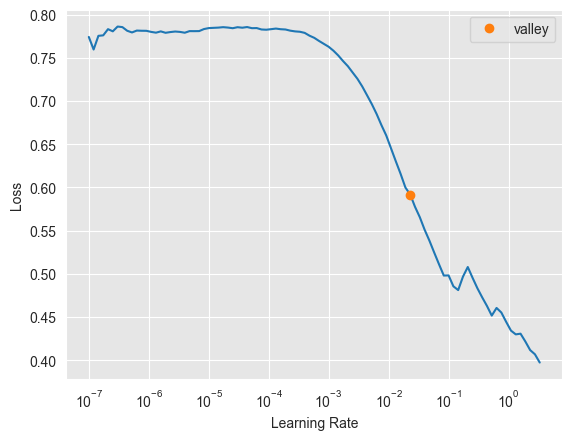

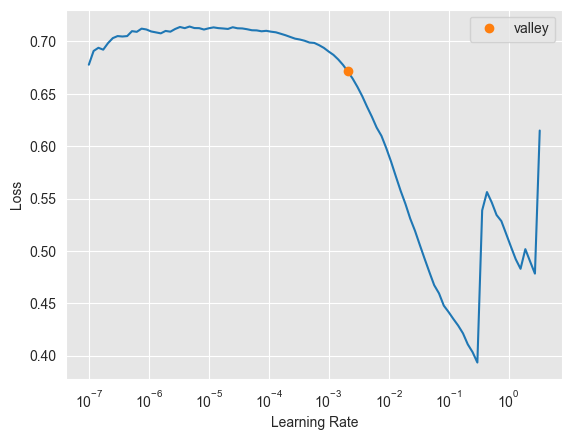

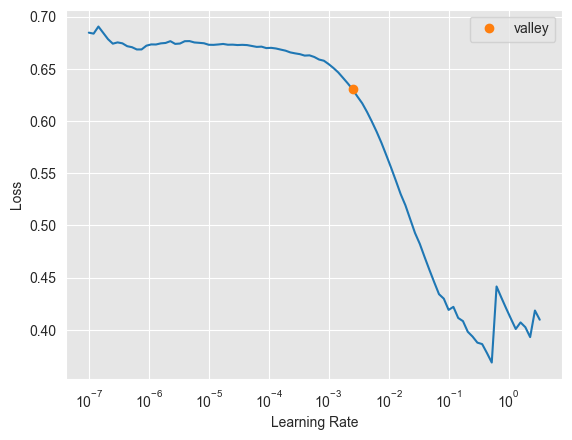

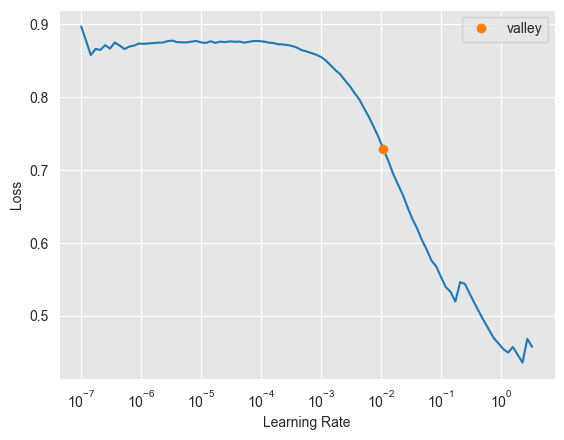

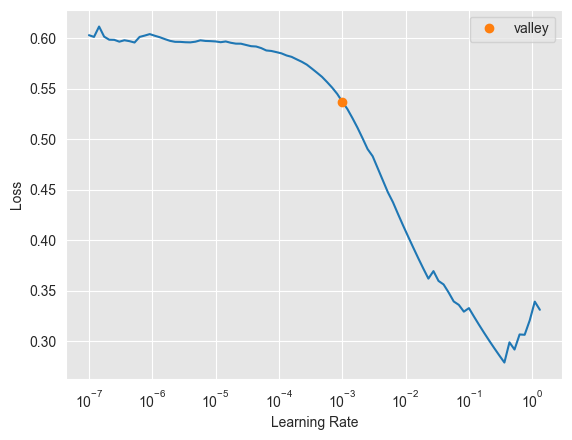

...

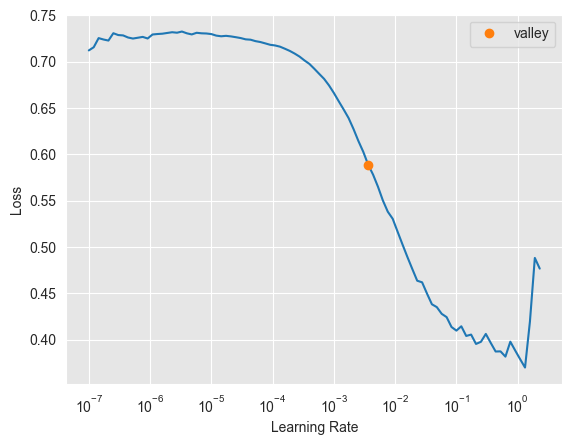

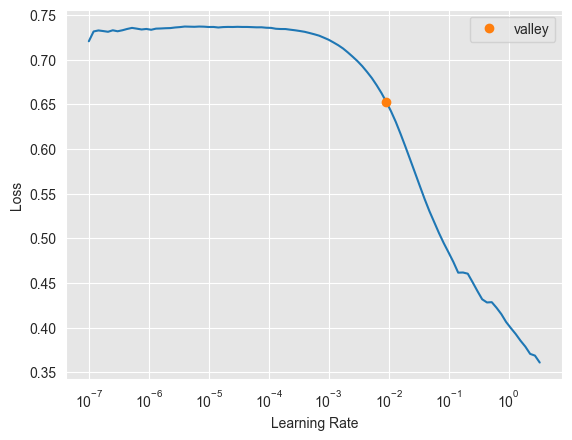

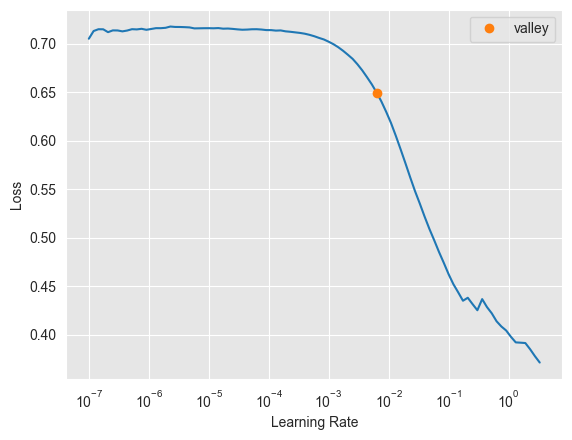

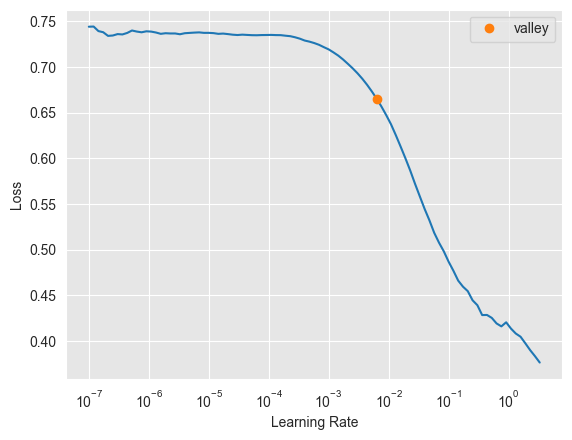

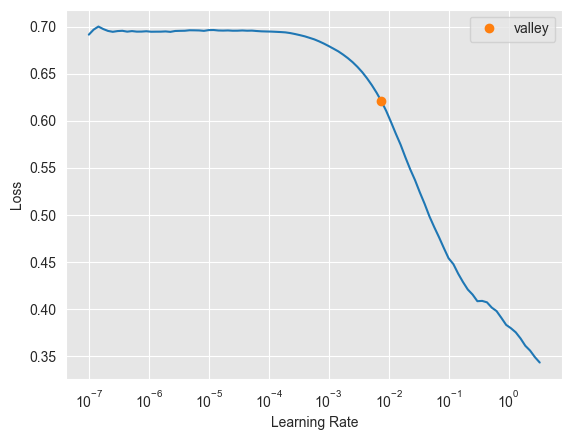

In [26]:
wandb.agent(sweep_id, train, count=60)